### Import Libraries

In [1]:
import glob
import math
import seaborn as sns
# import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
import datetime as dt # classes to work with date and time
import calendar
import matplotlib.dates as dates
import altair as alt
import geopandas as gpd

#!conda install -c conda-forge folium=0.5.0 --yes
import folium # plotting library
from folium.plugins import HeatMap, MarkerCluster

from collections import defaultdict
from scipy import stats


# make your plot outputs appear and be stored within the notebook
%matplotlib inline  

print('Folium installed')
print('Libraries imported.')

Folium installed
Libraries imported.


In [2]:
mpl.rcParams['axes.labelsize'] = 12
mpl.rcParams['axes.titlesize'] = 14
mpl.rcParams['figure.titlesize'] = 16

pd.set_option('display.max_columns', 500)

### Load Data

In [3]:
mps_colp_df = pd.concat(map(pd.read_csv, glob.glob('data/mps_colp_street/*.csv'))) 

In [4]:
restrict = pd.read_csv('data/restrictions.csv')
restrict['start_date'] = pd.to_datetime(restrict['start_date'], format="%d/%m/%Y")
restrict['end_date'] = pd.to_datetime(restrict['end_date'], format="%d/%m/%Y")
restrict['interval'] = dates.date2num(restrict['end_date']) - dates.date2num(restrict['start_date'])
restrict['interval'] = restrict.interval.astype(int)

gmobility_rolling = pd.read_csv('data/new_data/gmobility_rolling.csv')
gmobility_rolling['date'] = pd.to_datetime(gmobility_rolling['date'], format="%Y-%m-%d")
gmobility_rolling = gmobility_rolling.set_index(pd.DatetimeIndex(gmobility_rolling['date']))



In [5]:
gmobility_rolling.head()

,Borough,date,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
date,,,,,,,,
2020-02-15,City of London,2020-02-15,-5.00,-9.000000,-12.000000,-11.000000,-11.000000,-11.000000
2020-02-16,City of London,2020-02-16,-3.00,-15.000000,-17.500000,-12.000000,-12.000000,-12.000000
2020-02-17,City of London,2020-02-17,-3.00,-10.666667,-10.333333,-8.333333,-9.333333,-9.333333
2020-02-18,City of London,2020-02-18,-2.75,-8.500000,-8.000000,-6.750000,-7.500000,-7.500000
2020-02-19,City of London,2020-02-19,-3.60,-7.600000,-5.400000,-5.400000,-6.800000,-6.800000


### Initial Data Cleaning

In [6]:
mps_colp_df.reset_index(drop=True, inplace=True)

In [7]:
# initial data understanding
mps_colp_df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3301982 entries, 0 to 3301981
Data columns (total 12 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Crime ID               2359406 non-null  object 
 1   Month                  3301982 non-null  object 
 2   Reported by            3301982 non-null  object 
 3   Falls within           3301982 non-null  object 
 4   Longitude              3268310 non-null  float64
 5   Latitude               3268310 non-null  float64
 6   Location               3301982 non-null  object 
 7   LSOA code              3268310 non-null  object 
 8   LSOA name              3268310 non-null  object 
 9   Crime type             3301982 non-null  object 
 10  Last outcome category  2359406 non-null  object 
 11  Context                0 non-null        float64
dtypes: float64(3), object(9)
memory usage: 302.3+ MB


In [8]:
# remove any data with no location information - we are interested in spatial analysis as well as temporal for crime distribution
mps_colp_df = mps_colp_df[mps_colp_df['Longitude'].notna()]
mps_colp_df = mps_colp_df[mps_colp_df['Latitude'].notna()]


<i>Good! not much data has been lost (only 6473 values fall beyond our spatial scope), AND no missing values</i>

In [9]:
mps_colp_df['Month'].unique()

array(['2021-06', '2020-03', '2021-09', '2021-02', '2019-05', '2020-05',
       '2019-06', '2020-12', '2020-11', '2019-01', '2019-12', '2019-09',
       '2021-05', '2021-10', '2021-11', '2020-04', '2020-01', '2019-11',
       '2019-02', '2020-09', '2020-02', '2021-08', '2021-01', '2019-04',
       '2019-03', '2020-06', '2021-07', '2020-07', '2021-03', '2020-08',
       '2019-10', '2021-04', '2019-08', '2020-10', '2019-07'],
      dtype=object)

In [10]:
# extract borough names from 'LSOA name' for later analysis
mps_colp_df[['Borough', 'LSOA_number']] = mps_colp_df['LSOA name'].str.rsplit(' ', 1, expand=True)

# drop the 'LOSA_number' as we won't need it
mps_colp_df = mps_colp_df.drop(columns = 'LSOA_number', axis=1)
mps_colp_df.head()

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Context,Borough
0,3dafcc3a89da4afc120b498e25927fda0db86c7f643697...,2021-06,Metropolitan Police Service,Metropolitan Police Service,-3.363681,54.891352,On or near Dick Trod Lane,E01019127,Allerdale 001B,Other crime,Under investigation,NaN,Allerdale
1,a3fc829cbc1dc495a22833fb7bf19e3d6d3dcbc1c13f63...,2021-06,Metropolitan Police Service,Metropolitan Police Service,-0.612968,50.818989,On or near Canal Road,E01031472,Arun 006C,Violence and sexual offences,Under investigation,NaN,Arun
2,b9cc8c6459ef7d7e78d08b27d191179bb80e69b014de6f...,2021-06,Metropolitan Police Service,Metropolitan Police Service,-0.773868,51.975149,On or near Lower End,E01017696,Aylesbury Vale 003D,Violence and sexual offences,Investigation complete; no suspect identified,NaN,Aylesbury Vale
3,8a91d783552d68ec5822328077b69fb3e6ab69ee6a1ee8...,2021-06,Metropolitan Police Service,Metropolitan Police Service,-0.804480,51.820894,On or near Manor House Close,E01017699,Aylesbury Vale 014C,Violence and sexual offences,Under investigation,NaN,Aylesbury Vale
4,NaN,2021-06,Metropolitan Police Service,Metropolitan Police Service,0.137065,51.583672,On or near Police Station,E01000027,Barking and Dagenham 001A,Anti-social behaviour,NaN,NaN,Barking and Dagenham


In [11]:
mps_colp_df['Borough'].nunique()

346

In [12]:
# we are only interested in Greater London Area
londonBoroughs = ['City of London', 'Westminster','Kensington and Chelsea','Hammersmith and Fulham',\
                  'Wandsworth','Lambeth','Southwark','Tower Hamlets','Hackney','Islington','Camden',\
                  'Brent', 'Richmond upon Thames','Kingston upon Thames','Merton','Sutton','Croydon',\
                  'Greenwich','Bexley','Barking and Dagenham','Redbridge','Newham','Waltham Forest',\
                  'Haringey','Enfield','Barnet', 'Ealing','Hounslow','Havering','Harrow','Hillingdon',\
                  'Bromley','Lewisham']

mps_colp_df = (mps_colp_df[mps_colp_df['Borough'].isin(londonBoroughs)]).reset_index(drop=True)

In [13]:
# it should return 33 since there are 33 boroughs in London
mps_colp_df['Borough'].nunique()

33

In [14]:
# fix the dtypes for columns with text values to string
mps_colp_df[['Falls within', 'LSOA code', 'LSOA name', 'Crime type', 'Location', 'Borough']] = \
mps_colp_df[['Falls within', 'LSOA code', 'LSOA name', 'Crime type', 'Location', 'Borough']].astype((pd.StringDtype()))

# format datetime of 'Month' column to reflect the format we want (and carry it across all other datasets for later temporal analysis)
mps_colp_df['Month'] = pd.to_datetime(mps_colp_df['Month'], format='%Y-%m').dt.strftime('%Y-%m')


In [15]:
# check how the number has changed from 2256753
mps_colp_df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259045 entries, 0 to 3259044
Data columns (total 13 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Crime ID               2317254 non-null  object 
 1   Month                  3259045 non-null  object 
 2   Reported by            3259045 non-null  object 
 3   Falls within           3259045 non-null  string 
 4   Longitude              3259045 non-null  float64
 5   Latitude               3259045 non-null  float64
 6   Location               3259045 non-null  string 
 7   LSOA code              3259045 non-null  string 
 8   LSOA name              3259045 non-null  string 
 9   Crime type             3259045 non-null  string 
 10  Last outcome category  2317254 non-null  object 
 11  Context                0 non-null        float64
 12  Borough                3259045 non-null  string 
dtypes: float64(3), object(4), string(6)
memory usage: 323.2+ MB


In [16]:
# 'Context' column are all missing values, we can freely drop that column, 
# along with 'Crime ID' and 'Reported by' (since it is the same as 'Falls within')
# and Last outcome category' since it has a lot of data missing
mps_colp = mps_colp_df.drop(mps_colp_df.columns[[0, 2, 10, 11]], axis=1)
mps_colp.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259045 entries, 0 to 3259044
Data columns (total 9 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   Month         3259045 non-null  object 
 1   Falls within  3259045 non-null  string 
 2   Longitude     3259045 non-null  float64
 3   Latitude      3259045 non-null  float64
 4   Location      3259045 non-null  string 
 5   LSOA code     3259045 non-null  string 
 6   LSOA name     3259045 non-null  string 
 7   Crime type    3259045 non-null  string 
 8   Borough       3259045 non-null  string 
dtypes: float64(2), object(1), string(6)
memory usage: 223.8+ MB


In [17]:
mps_colp['Crime type'].unique()

<StringArray>
[       'Anti-social behaviour',                     'Burglary',
    'Criminal damage and arson',                  'Other theft',
                 'Public order',                'Vehicle crime',
 'Violence and sexual offences',                  'Other crime',
                      'Robbery',                        'Drugs',
        'Possession of weapons',                  'Shoplifting',
                'Bicycle theft',        'Theft from the person']
Length: 14, dtype: string

In [18]:
mps_colp.head()

,Month,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Borough
0,2021-06,Metropolitan Police Service,0.137065,51.583672,On or near Police Station,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
1,2021-06,Metropolitan Police Service,0.140035,51.589112,On or near Beansland Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
2,2021-06,Metropolitan Police Service,0.134947,51.588063,On or near Mead Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
3,2021-06,Metropolitan Police Service,0.135866,51.587336,On or near Gibbfield Close,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham
4,2021-06,Metropolitan Police Service,0.140634,51.583427,On or near Rams Grove,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham


In [19]:
mps_colp.describe()

,Longitude,Latitude
count,3.259045e+06,3.259045e+06
mean,-1.186491e-01,5.151124e+01
std,1.433147e-01,6.653601e-02
min,-5.076220e-01,5.129442e+01
25%,-2.010940e-01,5.147096e+01
50%,-1.118470e-01,5.151585e+01
75%,-3.075500e-02,5.155501e+01
max,3.071510e-01,5.168717e+01


In [20]:
mps_colp.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259045 entries, 0 to 3259044
Data columns (total 9 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   Month         3259045 non-null  object 
 1   Falls within  3259045 non-null  string 
 2   Longitude     3259045 non-null  float64
 3   Latitude      3259045 non-null  float64
 4   Location      3259045 non-null  string 
 5   LSOA code     3259045 non-null  string 
 6   LSOA name     3259045 non-null  string 
 7   Crime type    3259045 non-null  string 
 8   Borough       3259045 non-null  string 
dtypes: float64(2), object(1), string(6)
memory usage: 223.8+ MB


In [21]:
mps_colp['LSOA code'].nunique()

4831

In [22]:
mps_colp['Crime type'].unique()

<StringArray>
[       'Anti-social behaviour',                     'Burglary',
    'Criminal damage and arson',                  'Other theft',
                 'Public order',                'Vehicle crime',
 'Violence and sexual offences',                  'Other crime',
                      'Robbery',                        'Drugs',
        'Possession of weapons',                  'Shoplifting',
                'Bicycle theft',        'Theft from the person']
Length: 14, dtype: string

In [23]:
gmobility_rolling.columns.to_list()

['Borough',
 'date',
 'retail_and_recreation',
 'grocery_and_pharmacy',
 'parks',
 'transit_stations',
 'workplaces',
 'residential']

In [24]:
df = mps_colp.groupby(['Borough', 'Crime type', 'Month'])[['Month']].count().rename(columns={'Month':'Count'}).reset_index()
df['Month'] = pd.to_datetime(df['Month'], format='%Y-%m-%d')
df.to_csv('data/new_data/crime_borough_month.csv', index=False)                          
df.head()

,Borough,Crime type,Month,Count
0,Barking and Dagenham,Anti-social behaviour,2019-01-01,358
1,Barking and Dagenham,Anti-social behaviour,2019-02-01,345
2,Barking and Dagenham,Anti-social behaviour,2019-03-01,347
3,Barking and Dagenham,Anti-social behaviour,2019-04-01,374
4,Barking and Dagenham,Anti-social behaviour,2019-05-01,406


### Crime-Mobility-Restrictions per Crime type and Borough Bar plots

In [25]:
mobility_change = gmobility_rolling.copy()
mobility_change = mobility_change.groupby('Borough').resample('M').mean()

mobility_change = mobility_change.reset_index(drop=False)
mobility_change.date =  pd.to_datetime(mobility_change.date, format='%Y-%m').dt.strftime('%Y-%m')
mobility_change = mobility_change.set_index(pd.DatetimeIndex(mobility_change['date']))
# mobility_change = mobility_change.drop('parks', axis=1)
mobility_change.head()

,Borough,date,retail_and_recreation,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
date,,,,,,,,
2020-02-01,Barking and Dagenham,2020-02,-18.619048,-12.838095,-15.171429,-20.676190,-20.428571,6.733333
2020-03-01,Barking and Dagenham,2020-03,-15.857143,5.645161,9.894009,-17.046083,-16.958525,7.105991
2020-04-01,Barking and Dagenham,2020-04,-66.476190,-31.347619,31.209524,-60.933333,-63.928571,25.204762
2020-05-01,Barking and Dagenham,2020-05,-61.110599,-17.225806,81.175115,-50.732719,-55.322581,21.004608
2020-06-01,Barking and Dagenham,2020-06,-47.609524,-8.504762,100.976190,-41.042857,-41.428571,15.695238


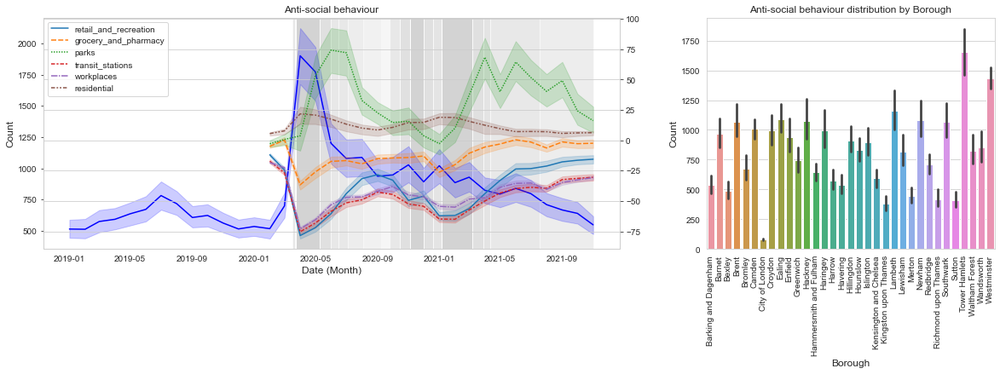

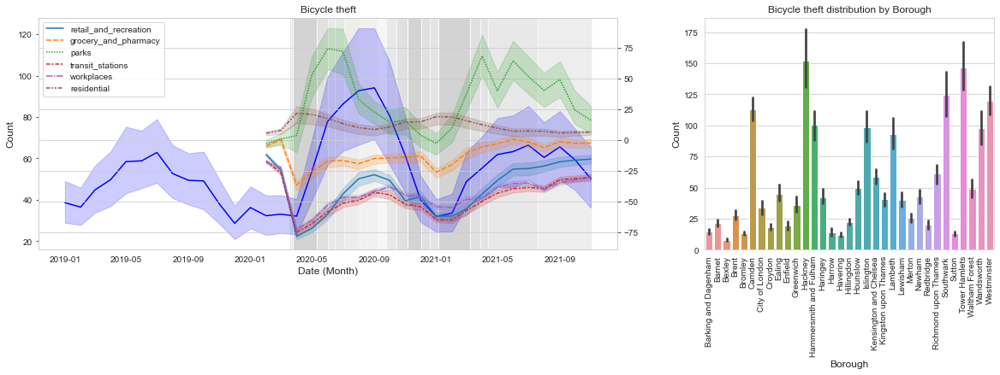

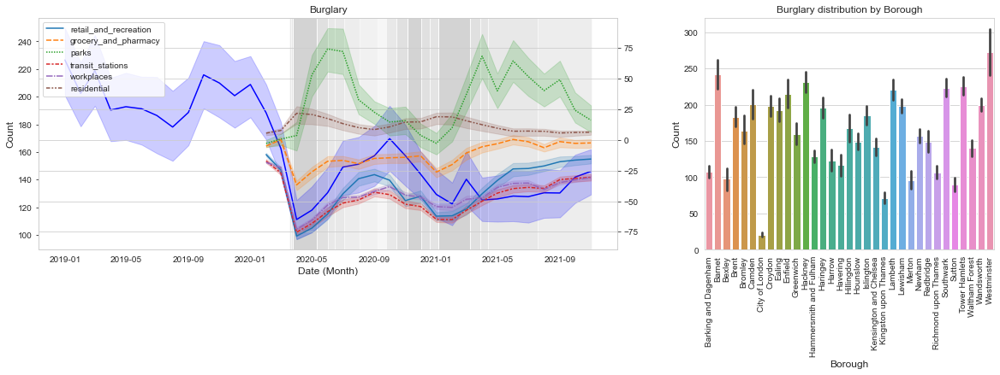

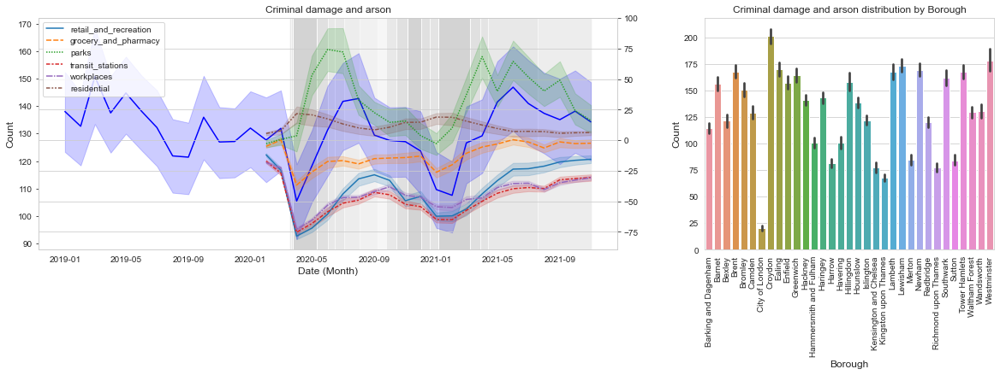

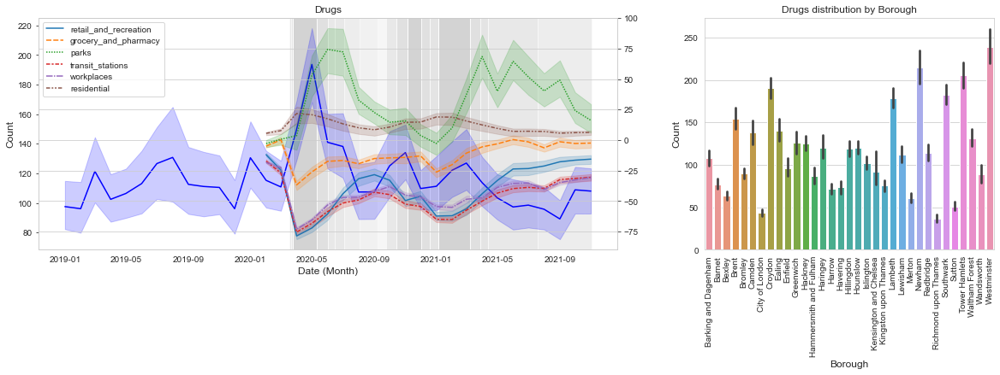

...

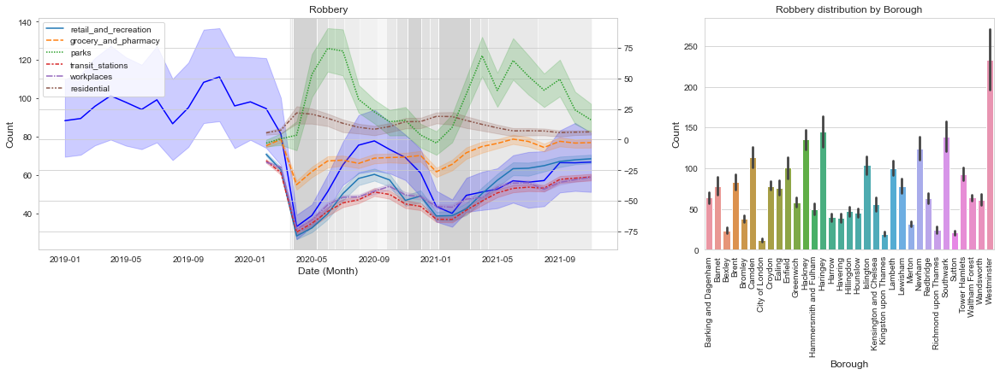

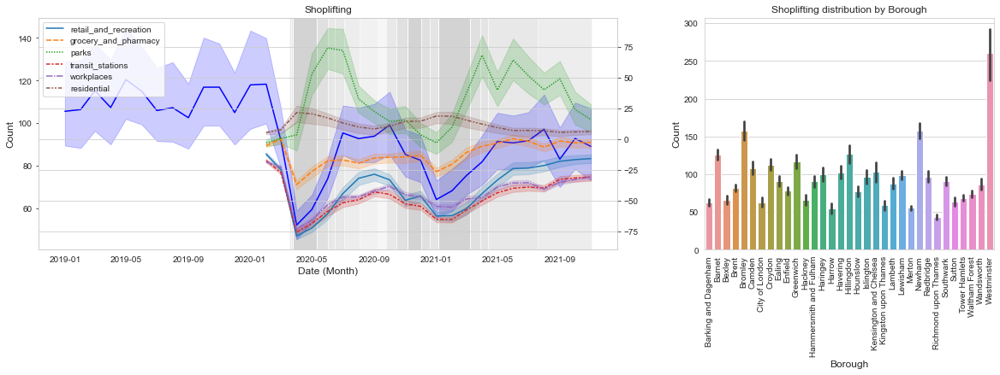

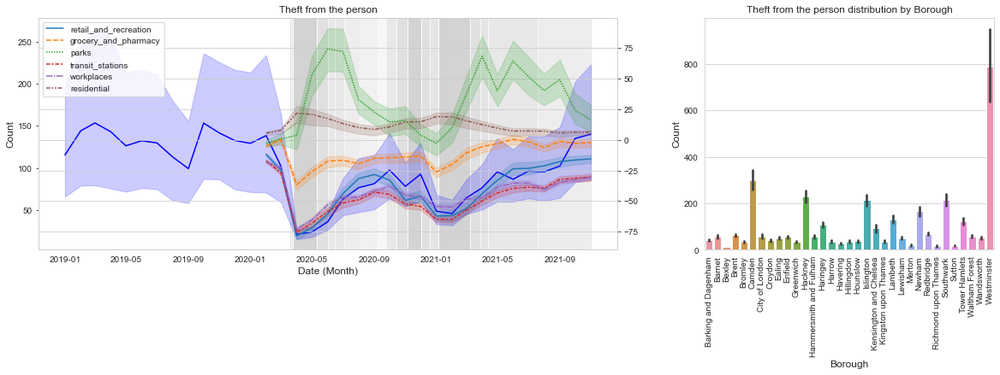

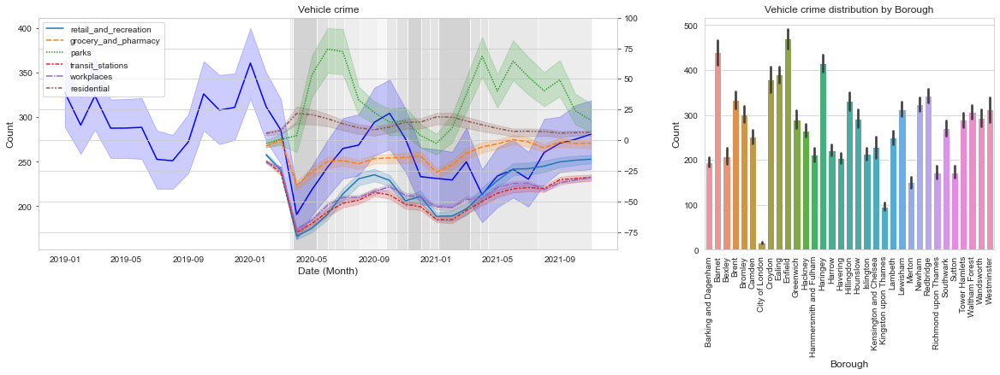

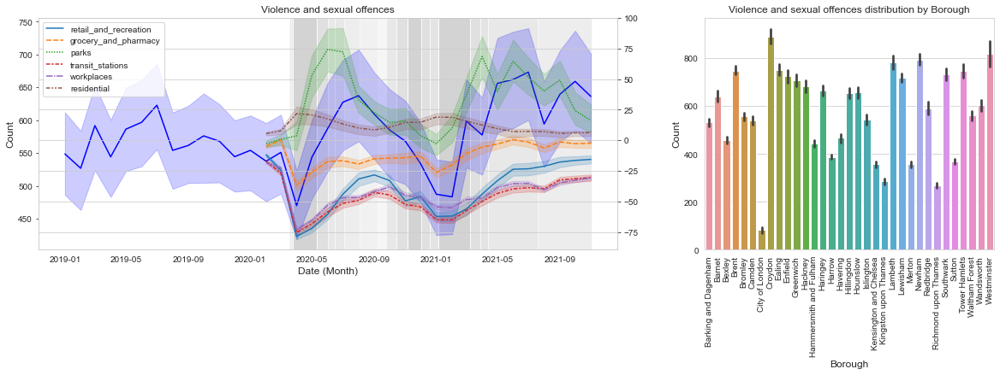

In [238]:
for index, ctype in enumerate(df['Crime type'].unique()):
    fig,(ax,ax1) = plt.subplots(ncols=2,figsize=(20,5),gridspec_kw={'width_ratios': [2, 1]})
    sns.barplot(x="Borough", y="Count", data=df[df['Crime type']==ctype])
    ax2 = ax.twinx()
    sns.lineplot(data=mobility_change, ax=ax2)
    # ax2.invert_yaxis()
    sns.lineplot(data=df[df['Crime type']==ctype],x='Month',y='Count',color='b',ax=ax)
    ax.set_title('{}'.format(ctype), fontsize=12)
    ax.set_xlabel('Date (Month)')
    ax.grid()
    xtick = df.Month
    ax.set_xticks(xtick, minor=True)
    ax1.xaxis.set_tick_params(rotation=90)
    ax1.set_title('{} distribution by Borough'.format(ctype), fontsize=12)
    plt.xticks(rotation=90, fontsize=8)
    for i, row in restrict.iterrows():
        ax.axvspan(xmin=row['start_date'], 
               xmax=row['end_date'], 
               edgecolor='white', 
               facecolor='lightgray', 
               alpha=row['Color'],
               zorder=0)

plt.show()

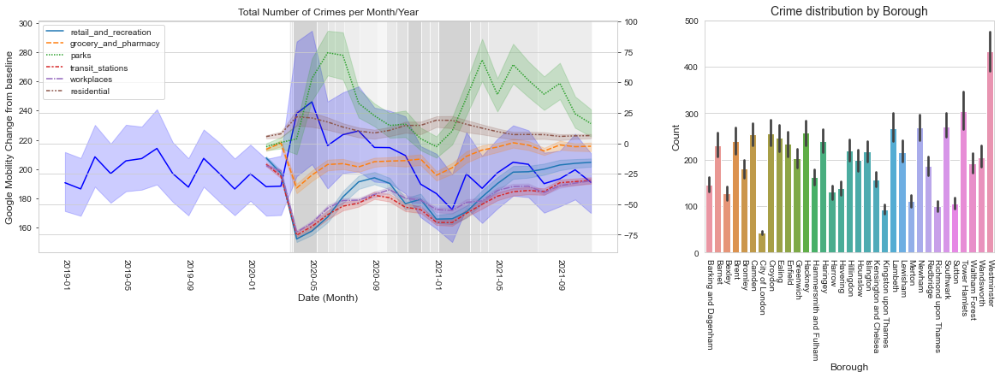

In [701]:

    fig,(ax,ax1) = plt.subplots(ncols=2,figsize=(20,5),gridspec_kw={'width_ratios': [2, 1]})
    
    sns.lineplot(data=df,x='Month',y='Count',color='b',ax=ax)
    ax2 = ax.twinx()
    sns.lineplot(data=mobility_change, ax=ax2)
    sns.barplot(x="Borough", y="Count", data=df, ax=ax1)   
    ax.set_title('Total Number of Crimes per Month/Year', fontsize=12)
    ax.set_xlabel('Date (Month)')
    ax.set_ylabel('Google Mobility Change from baseline')
    ax.grid()
    ax.set_xticks(df.Month, minor=True)
    # ax1.set_xticks(df.Borough.unique(), rotation=90)
    ax.xaxis.set_tick_params(rotation=270)
    ax1.xaxis.set_tick_params(rotation=270)
    ax1.set_title('Crime distribution by Borough')
    # plt.xticks(rotation=270, fontsize=8)
    for i, row in restrict.iterrows():
        ax.axvspan(xmin=row['start_date'], 
               xmax=row['end_date'], 
               edgecolor='white', 
               facecolor='lightgray', 
               alpha=row['Color'],
               zorder=0)
plt.show()

In [20]:
df.head()

,Borough,Crime type,Month,Count
0,Barking and Dagenham,Anti-social behaviour,2019-01-01,358
1,Barking and Dagenham,Anti-social behaviour,2019-02-01,345
2,Barking and Dagenham,Anti-social behaviour,2019-03-01,347
3,Barking and Dagenham,Anti-social behaviour,2019-04-01,374
4,Barking and Dagenham,Anti-social behaviour,2019-05-01,406


### Callendar plots

In [21]:
df['year'] = pd.DatetimeIndex(df['Month']).year
df['month'] = pd.DatetimeIndex(df['Month']).month

#fdd49e    10
#fdbb84     9
#fc8d59     6
#ef6548     5
#7f0000     2
#d7301f     2
#fff7ec     1
Name: Color, dtype: int64


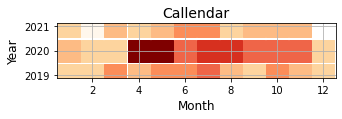

In [22]:
periodicity_month_year = df.groupby(['year','month'])['Count'].sum().reset_index()


# Assign color by count
palette = ['#fff7ec','#fee8c8','#fdd49e','#fdbb84','#fc8d59','#ef6548','#d7301f','#b30000','#7f0000']
no=(len(palette)-1)
periodicity_month_year['ColorID'] = np.ceil((periodicity_month_year.Count - periodicity_month_year.Count.min())/((periodicity_month_year.Count.max()-periodicity_month_year.Count.min())/no)).astype('int64')
Color=[]
for id in periodicity_month_year.ColorID:
    Color.append(palette[id])
periodicity_month_year['Color'] = Color
print(periodicity_month_year.Color.value_counts())

# Plot heatmap by total count (year Vs. Month)
plt.figure(figsize=(5, 1))

for id,row in periodicity_month_year.iterrows():    
        plt.scatter(row['month'],row['year'],alpha = 1, s=450, marker='s',c=row['Color'])
plt.xlabel('Month')
plt.ylabel('Year')
plt.title('Callendar')
colors = [(0,0,0)]
plt.grid()


#fdbb84    432
#fc8d59    308
#fdd49e    296
#fee8c8     49
#ef6548     42
#d7301f     11
#7f0000      9
#b30000      7
#fff7ec      1
Name: Color, dtype: int64


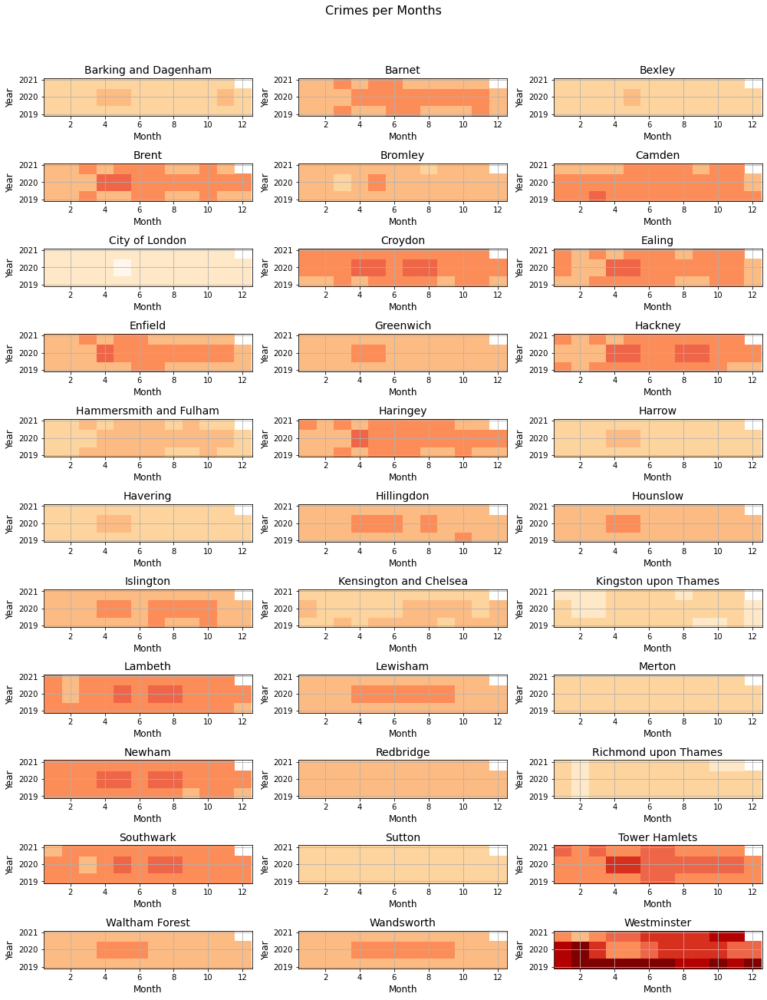

In [23]:
periodicity_month_year = df.groupby(['Borough', 'year','month'])['Count'].sum().reset_index()


# Assign color by count
palette = ['#fff7ec','#fee8c8','#fdd49e','#fdbb84','#fc8d59','#ef6548','#d7301f','#b30000','#7f0000']
no=(len(palette)-1)
periodicity_month_year['ColorID'] = np.ceil((periodicity_month_year.Count - periodicity_month_year.Count.min())/((periodicity_month_year.Count.max()-periodicity_month_year.Count.min())/no)).astype('int64')
Color=[]
for id in periodicity_month_year.ColorID:
    Color.append(palette[id])
periodicity_month_year['Color'] = Color

print(periodicity_month_year.Color.value_counts())

# Plot heatmap by total count (year Vs. Month)
plt.figure(figsize=(14, 19))
for index, borough in enumerate(periodicity_month_year['Borough'].unique()):
    plt.subplot(11, 3, index + 1)
    for id,row in periodicity_month_year[periodicity_month_year['Borough']==borough].iterrows():    
        plt.scatter(row['month'],row['year'],alpha = 1, s=450, marker='s',c=row['Color'])
    plt.xlabel('Month')
    plt.ylabel('Year')
    plt.title('{}'.format(borough))
    colors = [(0,0,0)]
    plt.grid()
plt.suptitle('Crimes per Months', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])


#fee8c8    376
#fdbb84     52
#fdd49e     44
#fc8d59     10
#ef6548      4
#7f0000      2
#fff7ec      1
#d7301f      1
Name: Color, dtype: int64


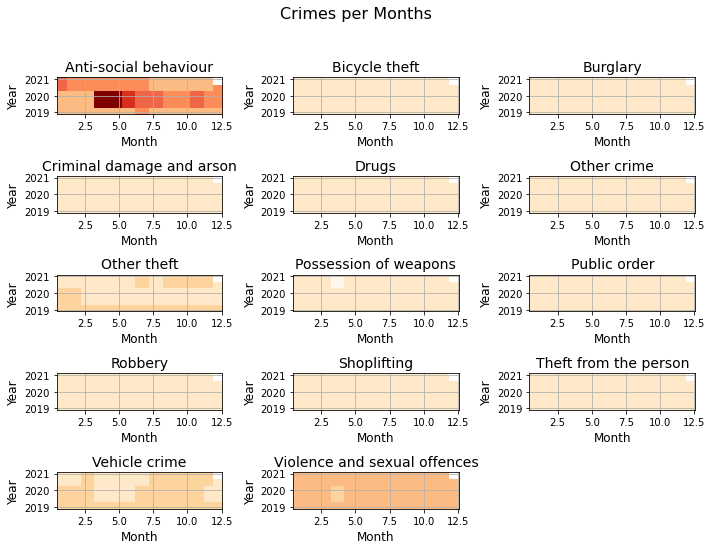

In [24]:
periodicity_month_year = df.groupby(['Crime type', 'year','month'])['Count'].sum().reset_index()


# Assign color by count
palette = ['#fff7ec','#fee8c8','#fdd49e','#fdbb84','#fc8d59','#ef6548','#d7301f','#b30000','#7f0000']
no=(len(palette)-1)
periodicity_month_year['ColorID'] = np.ceil((periodicity_month_year.Count - periodicity_month_year.Count.min())/((periodicity_month_year.Count.max()-periodicity_month_year.Count.min())/no)).astype('int64')
Color=[]
for id in periodicity_month_year.ColorID:
    Color.append(palette[id])
periodicity_month_year['Color'] = Color

print(periodicity_month_year.Color.value_counts())

# Plot heatmap by total count (year Vs. Month)
plt.figure(figsize=(10, 8))
for index, ctype in enumerate(periodicity_month_year['Crime type'].unique()):
    plt.subplot(5, 3, index + 1)
    df_plot = periodicity_month_year[periodicity_month_year['Crime type']==ctype].reset_index(drop=True)
    for id,row in df_plot.iterrows():    
        plt.scatter(row['month'],row['year'],alpha = 1, s=450, marker='s',c=row['Color'])
    plt.xlabel('Month')
    plt.ylabel('Year')
    # labels = [1,2,3,4,5,6,7,8,9,10,11,12]
    # plt.xticks(periodicity_month_year.month, labels, rotation='vertical')
    plt.title('{}'.format(ctype))
    colors = [(0,0,0)]
    plt.grid()
plt.suptitle('Crimes per Months', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])


In [25]:
df_pivot = df.pivot(index=['Borough', 'Crime type', 'month'], columns='year', values='Count').reset_index()
df_pivot.head()

year,Borough,Crime type,month,2019,2020,2021
0,Barking and Dagenham,Anti-social behaviour,1,358.0,339.0,688.0
1,Barking and Dagenham,Anti-social behaviour,2,345.0,318.0,585.0
2,Barking and Dagenham,Anti-social behaviour,3,347.0,466.0,600.0
3,Barking and Dagenham,Anti-social behaviour,4,374.0,1413.0,531.0
4,Barking and Dagenham,Anti-social behaviour,5,406.0,1118.0,469.0


### Aoristic Analysis

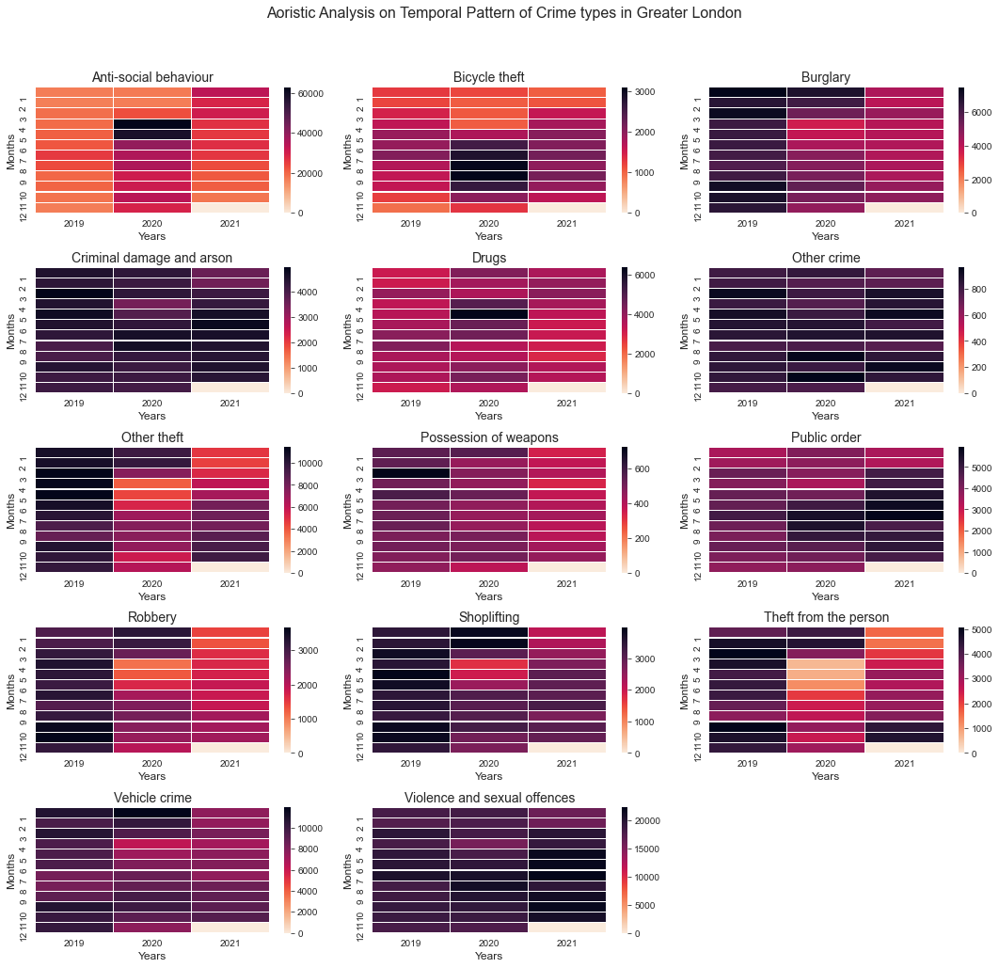

In [706]:
# Heatmap showing Temporal pattern of crime by hour of day and weekday
# Color map choice


years = [2019, 2020, 2021]
df_ct_group = df_pivot.groupby(['Crime type','month'])[years].sum().reset_index()
fig = plt.figure(figsize=(15, 15))
colormap=sns.cm.rocket_r
# df_hour_group=df_hour_group.drop(index=df_hour_group.shape[0]-1)
for index, ctype in enumerate(df_ct_group['Crime type'].unique()):
    colormap=sns.cm.rocket_r
    df_plot1 = df_ct_group[df_ct_group['Crime type']==ctype].reset_index(drop=True)
    max_value = df_plot1[years].max().max()
    min_value = df_plot1[years].min().min()
    plt.subplot(5, 3, index + 1)
    sns.heatmap(df_plot1[years],vmin=min_value,vmax=max_value,linewidths=.1,cmap=colormap)
    # plt.yticks_labels(range(1,13))
    # ax.set_yticklabels(df_pivot.month.unique())
    plt.ylabel('Months')
    plt.xlabel('Years')
    labels = [1,2,3,4,5,6,7,8,9,10,11,12]
    plt.title('{}'.format(ctype))
    plt.yticks(df_plot1.month, labels, rotation='vertical')

plt.suptitle('Aoristic Analysis on Temporal Pattern of Crime types in Greater London', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

fig.savefig('AoristicAnalysis.jpg')

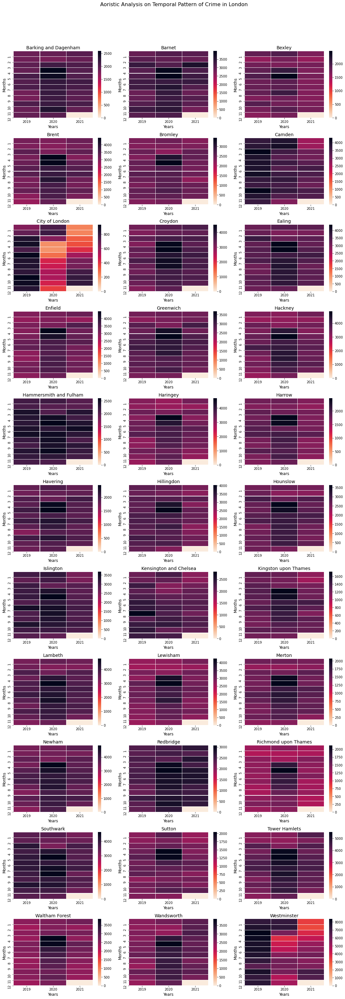

In [27]:
# Heatmap showing Temporal pattern of crime by hour of day and weekday
# Color map choice

years = [2019, 2020, 2021]
df_borough_group = df_pivot.groupby(['Borough','month'])[years].sum().reset_index()
plt.figure(figsize=(15, 45))
colormap=sns.cm.rocket_r
for index, borough in enumerate(df_borough_group['Borough'].unique()):
    colormap=sns.cm.rocket_r
    df_plot2 = df_borough_group[df_borough_group['Borough']==borough].reset_index(drop=True)
    max_value = df_plot2[years].max().max()
    min_value = df_plot2[years].min().min()
    plt.subplot(11, 3, index + 1)
    sns.heatmap(df_plot2[years],vmin=min_value,vmax=max_value,linewidths=.1,cmap=colormap)
    plt.ylabel('Months')
    plt.xlabel('Years')
    labels = [1,2,3,4,5,6,7,8,9,10,11,12]
    plt.title('{}'.format(borough))
    plt.yticks(df_plot2.month, labels, rotation='vertical')

plt.suptitle('Aoristic Analysis on Temporal Pattern of Crime in London', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [28]:
mps_colp.Month = pd.to_datetime(mps_colp.Month, format='%Y-%m-%d')
mps_colp.head()

,Month,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Borough
0,2021-06-01,Metropolitan Police Service,0.137065,51.583672,On or near Police Station,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
1,2021-06-01,Metropolitan Police Service,0.140035,51.589112,On or near Beansland Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
2,2021-06-01,Metropolitan Police Service,0.134947,51.588063,On or near Mead Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
3,2021-06-01,Metropolitan Police Service,0.135866,51.587336,On or near Gibbfield Close,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham
4,2021-06-01,Metropolitan Police Service,0.140634,51.583427,On or near Rams Grove,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham


### 3D plots

In [29]:
df3d = mps_colp.copy()
df3d['year'] = pd.DatetimeIndex(df3d['Month']).year
df3d['month'] = pd.DatetimeIndex(df3d['Month']).month

startdate = '2019-01-01'
df3d['TimeDist'] = (df3d.Month  - pd.to_datetime(startdate, format='%Y-%m-%d'))/np.timedelta64(1, 'M') # time distance by days
df3d['TimeDist'] = df3d['TimeDist'].astype(int)


In [30]:
df3d.head()

,Month,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Borough,year,month,TimeDist
0,2021-06-01,Metropolitan Police Service,0.137065,51.583672,On or near Police Station,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham,2021,6,28
1,2021-06-01,Metropolitan Police Service,0.140035,51.589112,On or near Beansland Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham,2021,6,28
2,2021-06-01,Metropolitan Police Service,0.134947,51.588063,On or near Mead Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham,2021,6,28
3,2021-06-01,Metropolitan Police Service,0.135866,51.587336,On or near Gibbfield Close,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham,2021,6,28
4,2021-06-01,Metropolitan Police Service,0.140634,51.583427,On or near Rams Grove,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham,2021,6,28


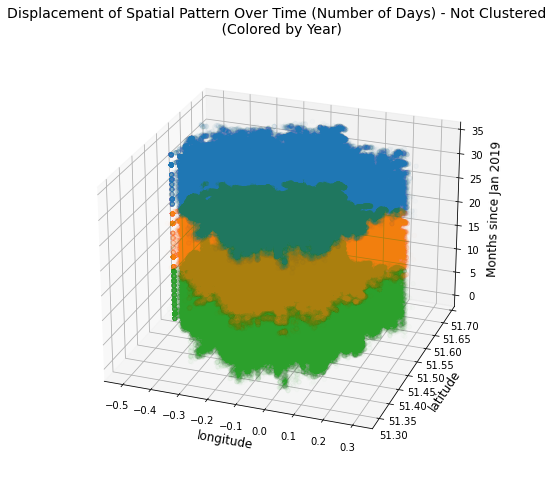

In [31]:
# Generate 3-D
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(1, figsize=(9, 6))

ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=25, azim=-70) # change parameters here for looking from a different perspective


years=df3d['year'].unique()
    
for year in years :
    this_year = df3d[df3d['year']==year].reset_index(drop=True)
    ax.scatter(this_year['Longitude'], this_year['Latitude'], this_year['TimeDist'], alpha=0.01,label=year)
    
ax.set_xlabel('longitude')
ax.set_ylabel('latitude')
ax.set_zlabel('Months since Jan 2019', fontsize=12, rotation = 90)

plt.title('Displacement of Spatial Pattern Over Time (Number of Days) - Not Clustered \n (Colored by Year)')
plt.show()

In [32]:
mps_colp['year'] = pd.DatetimeIndex(mps_colp['Month']).year
mps_colp['month'] = pd.DatetimeIndex(mps_colp['Month']).month

### Folium maps

#### pre covid

In [33]:
mps_colp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259045 entries, 0 to 3259044
Data columns (total 11 columns):
 #   Column        Dtype         
---  ------        -----         
 0   Month         datetime64[ns]
 1   Falls within  string        
 2   Longitude     float64       
 3   Latitude      float64       
 4   Location      string        
 5   LSOA code     string        
 6   LSOA name     string        
 7   Crime type    string        
 8   Borough       string        
 9   year          int64         
 10  month         int64         
dtypes: datetime64[ns](1), float64(2), int64(2), string(6)
memory usage: 273.5 MB


In [34]:
# Plot density heat map

latlonggroup=mps_colp[mps_colp['Month']<'2020-04-01'].groupby(['Latitude', 'Longitude'])['Falls within'].count().reset_index().rename(columns={'Falls within':'Count'})
latlonggroup_list = latlonggroup.values.tolist()

xmm=(latlonggroup.Longitude.min()+latlonggroup.Longitude.max())/2
ymm=(latlonggroup.Latitude.min()+latlonggroup.Latitude.max())/2

hmap = folium.Map(location=[ymm,xmm], zoom_start=10.4,tiles='cartodbpositron',crs='EPSG3857', width='90%', height='90%')
hm_wide = HeatMap(latlonggroup_list, 
                  min_opacity=0.7,
                  radius=5,
                  blur=9,               
                  gradient={.45:'green',.6: 'blue', .75: 'orange', 0.9: 'red',0.95:'black'}
                 )
hmap.add_child(hm_wide)

#### during covid

In [664]:
# Plot density heat map

latlonggroup=mps_colp[(mps_colp['Month']>'2020-03-01') & (mps_colp['Month']<'2021-05-01')].groupby(['Latitude', 'Longitude'])['Falls within'].count().reset_index().rename(columns={'Falls within':'Count'})
latlonggroup_list = latlonggroup.values.tolist()

xmm=(latlonggroup.Longitude.min()+latlonggroup.Longitude.max())/2
ymm=(latlonggroup.Latitude.min()+latlonggroup.Latitude.max())/2

# max_val=np.percentile(latlonggroup.Count,75)
hmap = folium.Map(location=[ymm,xmm], zoom_start=10.4,tiles='cartodbpositron',crs='EPSG3857', width='90%', height='90%')
hm_wide = HeatMap(latlonggroup_list, 
                  min_opacity=0.7,
                  radius=5,
                  blur=9,
                  # max_val=max_val,                
                  gradient={.45:'green',.6: 'blue', .75: 'orange', 0.9: 'red',0.95:'black'}
                 )
hmap.add_child(hm_wide)

#### post covid

In [660]:
# Plot density heat map

latlonggroup=mps_colp[mps_colp['Month']>'2021-04-01'].groupby(['Latitude', 'Longitude'])['Falls within'].count().reset_index().rename(columns={'Falls within':'Count'})
latlonggroup_list = latlonggroup.values.tolist()

xmm=(latlonggroup.Longitude.min()+latlonggroup.Longitude.max())/2
ymm=(latlonggroup.Latitude.min()+latlonggroup.Latitude.max())/2

hmap = folium.Map(location=[ymm,xmm], zoom_start=10.4,tiles='cartodbpositron',crs='EPSG3857', width='90%', height='90%')
hm_wide = HeatMap(latlonggroup_list, 
                  min_opacity=0.7,
                  radius=5,
                  blur=9,               
                  gradient={.45:'green',.6: 'blue', .75: 'orange', 0.9: 'red',0.95:'black'})
hmap.add_child(hm_wide)

In [37]:
# check the resulting dtypes
mps_colp.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3259045 entries, 0 to 3259044
Data columns (total 11 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   Month         3259045 non-null  datetime64[ns]
 1   Falls within  3259045 non-null  string        
 2   Longitude     3259045 non-null  float64       
 3   Latitude      3259045 non-null  float64       
 4   Location      3259045 non-null  string        
 5   LSOA code     3259045 non-null  string        
 6   LSOA name     3259045 non-null  string        
 7   Crime type    3259045 non-null  string        
 8   Borough       3259045 non-null  string        
 9   year          3259045 non-null  int64         
 10  month         3259045 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(2), string(6)
memory usage: 273.5 MB


In [38]:
# MPS Data holds 2238179 (mojority) of our data
mps = mps_colp[mps_colp['Falls within']=='Metropolitan Police Service']
mps.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3238995 entries, 0 to 3257532
Data columns (total 11 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   Month         3238995 non-null  datetime64[ns]
 1   Falls within  3238995 non-null  string        
 2   Longitude     3238995 non-null  float64       
 3   Latitude      3238995 non-null  float64       
 4   Location      3238995 non-null  string        
 5   LSOA code     3238995 non-null  string        
 6   LSOA name     3238995 non-null  string        
 7   Crime type    3238995 non-null  string        
 8   Borough       3238995 non-null  string        
 9   year          3238995 non-null  int64         
 10  month         3238995 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(2), string(6)
memory usage: 296.5 MB


In [39]:
# CoLP holds only crimes from City of London area --> 12101 entries
colp = mps_colp[mps_colp['Falls within']=='City of London Police']
colp.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20050 entries, 94057 to 3259044
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Month         20050 non-null  datetime64[ns]
 1   Falls within  20050 non-null  string        
 2   Longitude     20050 non-null  float64       
 3   Latitude      20050 non-null  float64       
 4   Location      20050 non-null  string        
 5   LSOA code     20050 non-null  string        
 6   LSOA name     20050 non-null  string        
 7   Crime type    20050 non-null  string        
 8   Borough       20050 non-null  string        
 9   year          20050 non-null  int64         
 10  month         20050 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(2), string(6)
memory usage: 1.8 MB


### Crime Types analysis

In [40]:
mps_colp['Month'] = pd.to_datetime(mps_colp['Month'], format='%Y-%m').dt.strftime('%Y-%m')


In [29]:
mps_colp1 = mps_colp.copy()
mps_colp1['Month'] = pd.to_datetime(mps_colp1['Month'], format='%Y-%m').dt.strftime('%Y-%m')
mps_colp1['Crime_count1'] = 1
mps_colp1 = mps_colp1.groupby(['Borough', 'Month', 'Crime type'])['Crime_count1'].sum().reset_index()

In [30]:
mps_colp2 = mps_colp1.pivot_table(index= ['Crime type'], columns = 'Month', 
                                    values = "Crime_count1", aggfunc = np.sum,
                                    fill_value = 0).reset_index()

In [31]:
mps_colp2 = mps_colp2.sort_values(by='Crime type', ascending=False).reset_index(drop=True)

In [32]:
mps_colp2.head(3)

Month,Crime type,2019-01,2019-02,2019-03,2019-04,2019-05,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12,2021-01,2021-02,2021-03,2021-04,2021-05,2021-06,2021-07,2021-08,2021-09,2021-10,2021-11
0,Violence and sexual offences,18110,17389,19531,17963,19352,19698,20557,18289,18537,19014,18749,17971,18289,17744,18186,15516,17943,19382,20705,21035,20098,19314,18745,17621,16085,15957,19762,19062,21653,21846,22215,19609,21099,21752,20997
1,Vehicle crime,10813,9611,10701,9498,9502,9529,8340,8291,8994,10767,10167,10269,11913,10296,9424,6297,7214,8052,8744,8871,9719,10050,9106,7698,7635,7576,8251,7032,7723,7971,7607,8598,8937,9083,9272
2,Theft from the person,3810,4754,5066,4724,4171,4366,4285,3734,3277,5061,4672,4378,4268,4570,3380,684,799,1189,2084,2531,2690,3218,2583,3061,1609,1518,2127,2528,3151,2861,3177,3148,3380,4457,4627


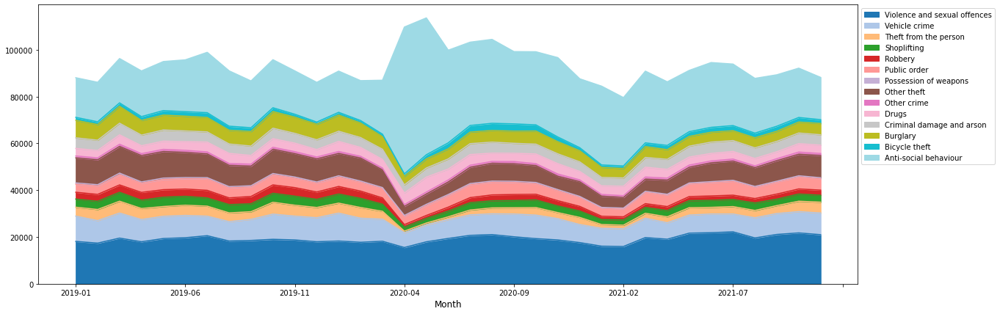

In [33]:
# sns.set()
plt.rcParams["figure.figsize"] = (20,7)
# Bar plot
# ax = mps_colp2.set_index(['Crime type']).T.plot(kind='bar', stacked=True, colormap='tab20')
# Area map
ax = mps_colp2.set_index(['Crime type']).T.plot.area(colormap='tab20');
ax.legend(bbox_to_anchor=(1.0, 1.0))
# ax.axvspan(15, 17, alpha=0.1, color='red')
# ax.axvspan(22, 23, alpha=0.1, color='red')
# ax.axvspan(24, 25, alpha=0.1, color='red')

In [34]:
mps_colp3 = mps_colp1.pivot_table(index= ['Crime type', 'Borough'], columns = 'Month', 
                                    values = "Crime_count1", aggfunc = np.sum,
                                    fill_value = 0).reset_index()
mps_colp3.head(2)

Month,Crime type,Borough,2019-01,2019-02,2019-03,2019-04,2019-05,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12,2021-01,2021-02,2021-03,2021-04,2021-05,2021-06,2021-07,2021-08,2021-09,2021-10,2021-11
0,Anti-social behaviour,Barking and Dagenham,358,345,347,374,406,443,494,484,377,432,393,366,339,318,466,1413,1118,718,661,686,641,639,750,620,688,585,600,531,469,507,521,499,439,441,357
1,Anti-social behaviour,Barnet,556,588,634,688,735,758,828,790,682,743,711,615,637,588,862,2331,2054,1385,1302,1142,1125,1094,1190,1051,1260,1099,1259,1035,995,981,954,816,853,769,649


/Users/mammej/opt/anaconda3/envs/VA_coursework/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


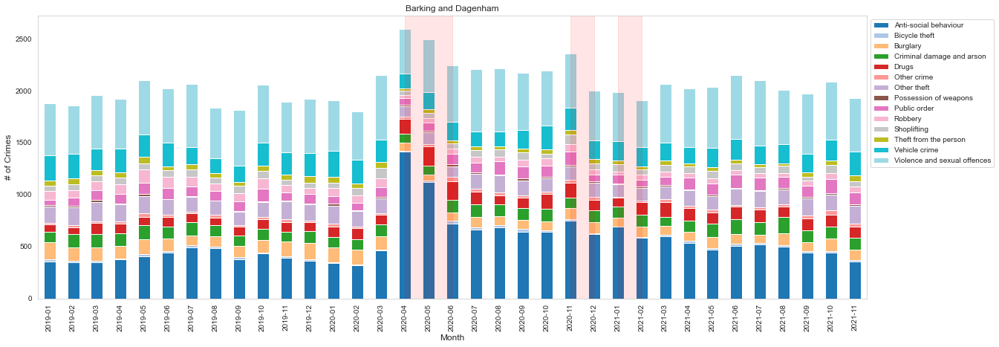

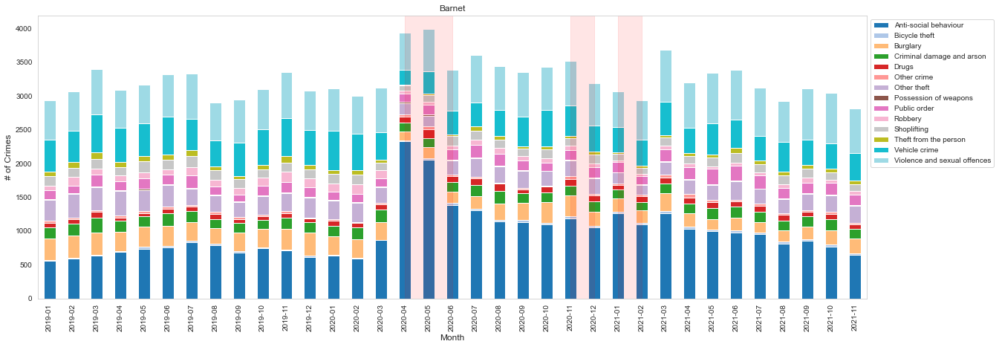

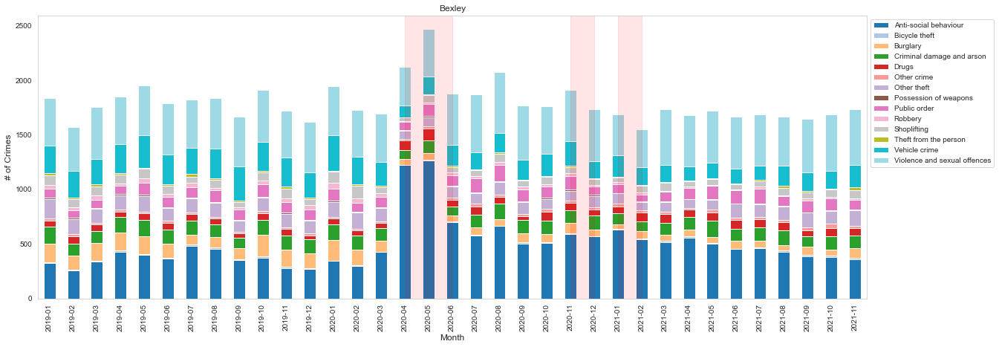

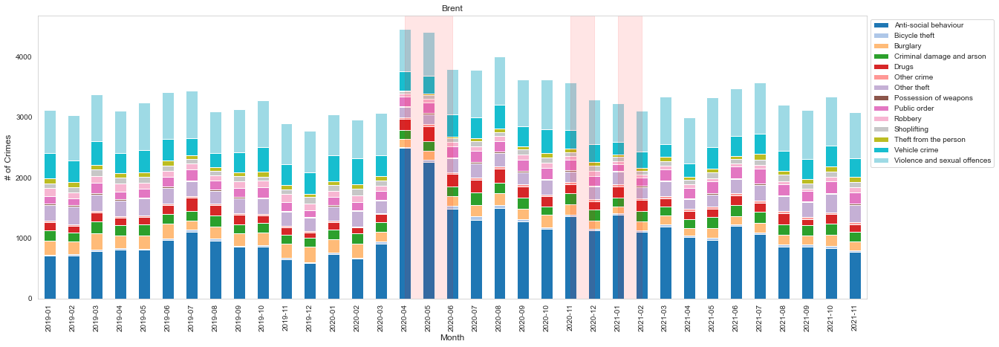

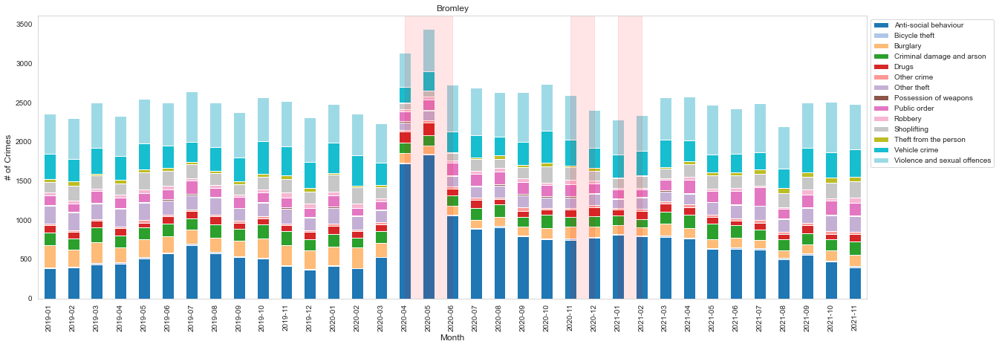

...

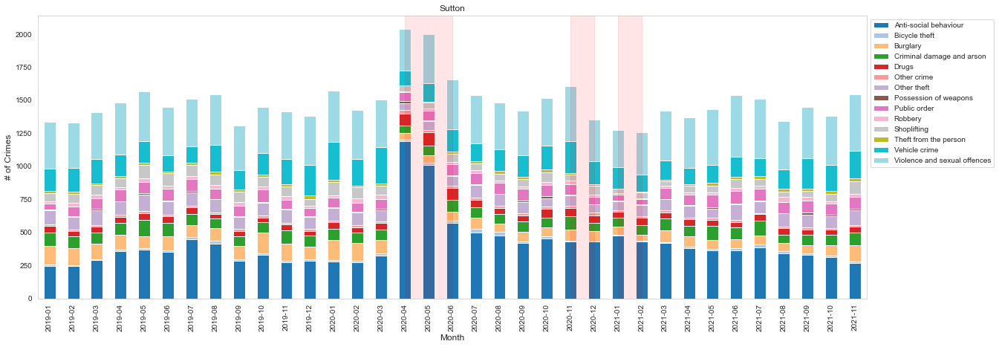

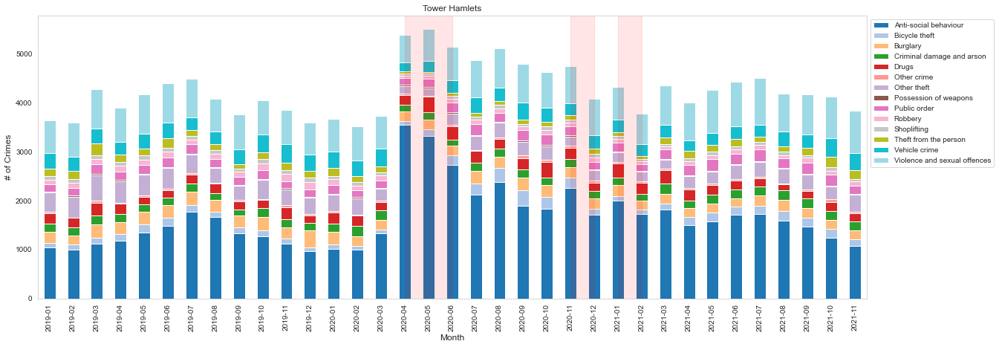

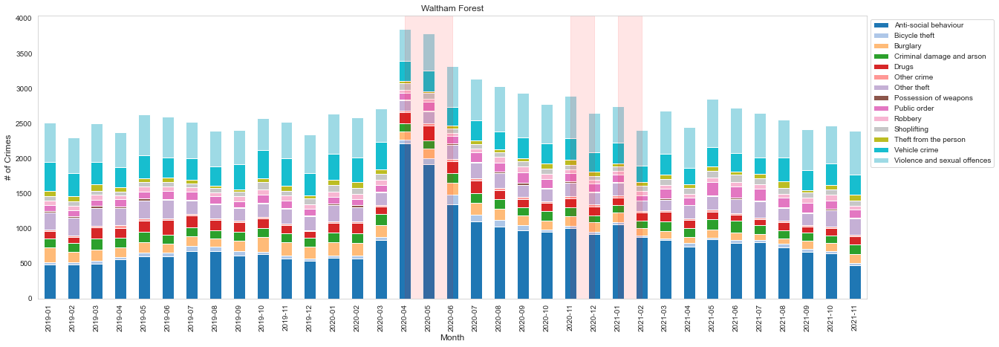

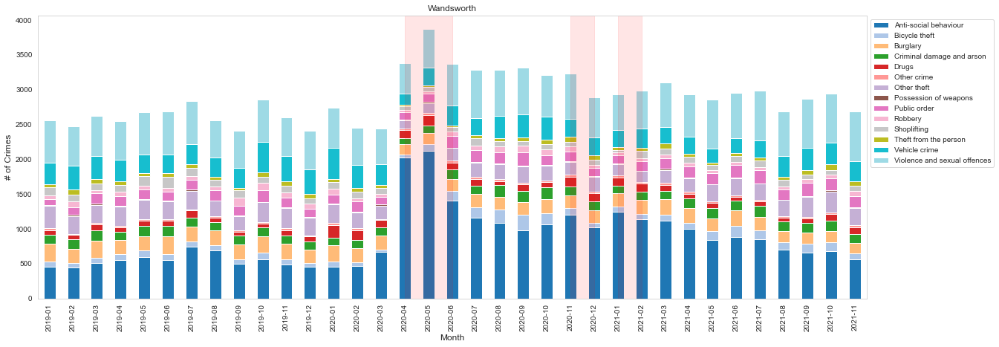

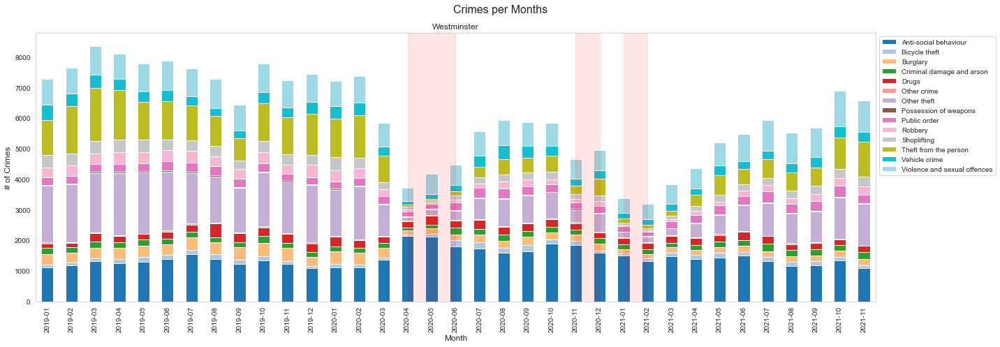

In [35]:
# plt.figure(figsize=(20, 45))
# plt.rcParams["figure.figsize"] = (20,7)
# plt.rcParams.update({'figure.max_open_warning': 0})

for index, borough in enumerate(mps_colp1['Borough'].unique()):
    # plt.subplot(11, 3, index + 1)
    sns.set_style("whitegrid")
    # Bar plot
    ax = mps_colp1[mps_colp1['Borough']==borough].pivot_table(index= ['Crime type'], columns = 'Month', 
        values = "Crime_count1", aggfunc = np.sum,
        fill_value = 0).reset_index().set_index(['Crime type']).T.plot(kind='bar', stacked=True, colormap='tab20')
    
    # Area plot
#     ax = mps_colp1[mps_colp1['Borough']==borough].pivot_table(index= ['Crime type'], columns = 'Month', 
#         values = "Crime_count1", aggfunc = np.sum,
#         fill_value = 0).reset_index().set_index(['Crime type']).T.plot.area(colormap='tab20');
    
    ax.legend(bbox_to_anchor=(1.0, 1.0),loc='upper left')
    plt.grid()
    plt.title('{}'.format(borough), fontsize=12)
    plt.xlabel('Month')
    plt.ylabel('# of Crimes')
    plt.xticks(rotation=90)
    axes = plt.gca()
    y_min, y_max = axes.get_ylim()
    # plt.vlines(x=[15, 22, 24], ymin=0, ymax=y_max, colors='gray', lw=30, label='lockdown', alpha=0.1)
    ax.axvspan(15, 17, alpha=0.1, color='red')
    ax.axvspan(22, 23, alpha=0.1, color='red')
    ax.axvspan(24, 25, alpha=0.1, color='red')
plt.suptitle('Crimes per Months', fontsize=16)
plt.tight_layout()


In [36]:
mps_colp.to_csv('data/new_data/mps_colp.csv', index=False)

In [37]:
mps_colp.head()

,Month,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Borough
0,2021-06,Metropolitan Police Service,0.137065,51.583672,On or near Police Station,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
1,2021-06,Metropolitan Police Service,0.140035,51.589112,On or near Beansland Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
2,2021-06,Metropolitan Police Service,0.134947,51.588063,On or near Mead Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham
3,2021-06,Metropolitan Police Service,0.135866,51.587336,On or near Gibbfield Close,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham
4,2021-06,Metropolitan Police Service,0.140634,51.583427,On or near Rams Grove,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham


In [38]:
# reshape the dataframe for crime analysis
crime = mps_colp.groupby(['Borough',  'Month','Crime type',]).size().unstack().reset_index(drop=False).fillna(0)
# rename 'Crime Type' to 'Major Category'
crime.rename(columns={'Crime type':'Minor Category'}, inplace=True)
# add 'Minor Category' column
# crime['Minor Category'] = np.nan
# # move 'Minor Category' column after 'Major Category'
# col = crime['Minor Category']
# crime.insert(crime.columns.get_loc('Major Category') + 1, col.name, col, allow_duplicates=True)
# delete the last column
# crime = crime.iloc[:, :-1]
# add Total column to MPS data
crime['Total'] = crime.sum(axis=1, numeric_only=True)
# delete index name
crime.columns.name = None
crime.head(2)

crime.to_csv('data/new_data/crime_gp_boroughmonth.csv', index=False)

In [39]:
crime_by_month = pd.crosstab(mps_colp['Month'], mps_colp['Crime type'])
crime_by_month.head(2)

Crime type,Anti-social behaviour,Bicycle theft,Burglary,Criminal damage and arson,Drugs,Other crime,Other theft,Possession of weapons,Public order,Robbery,Shoplifting,Theft from the person,Vehicle crime,Violence and sexual offences
Month,,,,,,,,,,,,,,
2019-01,16937,1274,7477,4555,3219,806,10709,550,3435,2916,3486,3810,10813,18110
2019-02,16883,1204,6680,4378,3172,802,10678,543,3585,2953,3513,4754,9611,17389


In [40]:
crime_by_borough = pd.crosstab(mps_colp['Crime type'], mps_colp['Borough'])
crime_by_borough.head(2)

Borough,Barking and Dagenham,Barnet,Bexley,Brent,Bromley,Camden,City of London,Croydon,Ealing,Enfield,Greenwich,Hackney,Hammersmith and Fulham,Haringey,Harrow,Havering,Hillingdon,Hounslow,Islington,Kensington and Chelsea,Kingston upon Thames,Lambeth,Lewisham,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
Crime type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Anti-social behaviour,18825,33759,17198,37284,23564,35288,2811,34783,38066,32915,26012,37548,22533,34898,20087,18863,31770,29055,31345,20882,13277,40701,28669,15618,37857,24914,14732,37468,14335,57890,28827,29909,50108
Bicycle theft,518,763,282,969,469,3964,1186,646,1573,684,1271,5326,3518,1486,498,417,791,1743,3439,2060,1417,3262,1405,896,1492,700,2138,4371,457,5142,1705,3420,4195


In [41]:
month_by_borough = pd.crosstab(mps_colp['Month'], mps_colp['Borough'])
month_by_borough.head(2)

Borough,Barking and Dagenham,Barnet,Bexley,Brent,Bromley,Camden,City of London,Croydon,Ealing,Enfield,Greenwich,Hackney,Hammersmith and Fulham,Haringey,Harrow,Havering,Hillingdon,Hounslow,Islington,Kensington and Chelsea,Kingston upon Thames,Lambeth,Lewisham,Merton,Newham,Redbridge,Richmond upon Thames,Southwark,Sutton,Tower Hamlets,Waltham Forest,Wandsworth,Westminster
Month,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01,1878,2940,1838,3125,2360,3723,626,3204,3186,3012,2588,3283,2151,3115,1763,1825,3047,2585,3039,2047,1279,3332,2673,1486,3378,2437,1288,3550,1337,3647,2509,2560,7286
2019-02,1859,3065,1572,3033,2302,3833,696,3062,3219,2834,2388,3028,2110,3012,1670,1755,2949,2656,2769,2053,1237,3396,2559,1301,3382,2360,1192,3493,1329,3588,2301,2479,7663


## Borough Level Crime

In [45]:
# set the filepath and load in a shapefile

fp = 'Data/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp'
UK_Borough = gpd.read_file(fp)
UK_Borough = UK_Borough[["NAME", "geometry"]]
# check data type so we can see that this is not a normal dataframe, but a GEOdataframe
UK_Borough.head()



,NAME,geometry
0,Kingston upon Thames,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [46]:
mps_colp['covid_restrictions'] = 'during_covid'
mps_colp.loc[mps_colp['Month']<'2020-04-01', 'covid_restrictions'] = 'pre_covid'
mps_colp.loc[mps_colp['Month']>'2021-02-01', 'covid_restrictions'] = 'post_covid'
mps_colp.head()

,Month,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Borough,covid_restrictions
0,2021-06,Metropolitan Police Service,0.137065,51.583672,On or near Police Station,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham,post_covid
1,2021-06,Metropolitan Police Service,0.140035,51.589112,On or near Beansland Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham,post_covid
2,2021-06,Metropolitan Police Service,0.134947,51.588063,On or near Mead Grove,E01000027,Barking and Dagenham 001A,Anti-social behaviour,Barking and Dagenham,post_covid
3,2021-06,Metropolitan Police Service,0.135866,51.587336,On or near Gibbfield Close,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham,post_covid
4,2021-06,Metropolitan Police Service,0.140634,51.583427,On or near Rams Grove,E01000027,Barking and Dagenham 001A,Burglary,Barking and Dagenham,post_covid


In [47]:
mps_colp['covid_restrictions'].unique()

array(['post_covid', 'pre_covid', 'during_covid'], dtype=object)

In [48]:
borough_crimes_all = mps_colp[['Borough', 'Crime type','covid_restrictions']].copy()
borough_crimes_all = borough_crimes_all.groupby(['Borough','Crime type', 'covid_restrictions'])[['covid_restrictions']].count().rename(columns={'covid_restrictions':'Count'}).reset_index()
borough_crimes_all.head()

,Borough,Crime type,covid_restrictions,Count
0,Barking and Dagenham,Anti-social behaviour,during_covid,7106
1,Barking and Dagenham,Anti-social behaviour,post_covid,4364
2,Barking and Dagenham,Anti-social behaviour,pre_covid,7355
3,Barking and Dagenham,Bicycle theft,during_covid,149
4,Barking and Dagenham,Bicycle theft,post_covid,155


In [49]:
borough_crimes_pivot = borough_crimes_all.pivot(index=['Borough', 'Crime type'], columns='covid_restrictions', values='Count').reset_index()
borough_crimes_pivot.head()

covid_restrictions,Borough,Crime type,during_covid,post_covid,pre_covid
0,Barking and Dagenham,Anti-social behaviour,7106,4364,7355
1,Barking and Dagenham,Bicycle theft,149,155,214
2,Barking and Dagenham,Burglary,908,850,2010
3,Barking and Dagenham,Criminal damage and arson,1117,1085,1801
4,Barking and Dagenham,Drugs,1257,1068,1455


In [50]:
borough_crime_melt = borough_crimes_pivot.melt(id_vars=['Borough','Crime type'], var_name="covid_restrictions")
borough_crime_melt.head()

,Borough,Crime type,covid_restrictions,value
0,Barking and Dagenham,Anti-social behaviour,during_covid,7106
1,Barking and Dagenham,Bicycle theft,during_covid,149
2,Barking and Dagenham,Burglary,during_covid,908
3,Barking and Dagenham,Criminal damage and arson,during_covid,1117
4,Barking and Dagenham,Drugs,during_covid,1257


In [51]:
#use the pivot table function, set index to LSOA, column names to be the major categories, and values from the 2019 column
#we want to agg by the sum and we want to fill any empty values with a zero
borough_crime_year = borough_crime_melt.pivot_table(index= ['Borough', 'covid_restrictions'], columns = 'Crime type', 
                                    values = "value", aggfunc = np.sum,
                                    fill_value = 0).reset_index()
#then rename the axis
borough_crime_year.rename_axis(None,axis=1, inplace=True)
borough_crime_year.head()

,Borough,covid_restrictions,Anti-social behaviour,Bicycle theft,Burglary,Criminal damage and arson,Drugs,Other crime,Other theft,Possession of weapons,Public order,Robbery,Shoplifting,Theft from the person,Vehicle crime,Violence and sexual offences
0,Barking and Dagenham,during_covid,7106,149,908,1117,1257,252,1299,139,976,523,627,351,1802,5280
1,Barking and Dagenham,post_covid,4364,155,850,1085,1068,233,1348,95,1024,423,556,337,1698,5132
2,Barking and Dagenham,pre_covid,7355,214,2010,1801,1455,335,2439,177,1393,1291,1005,755,3348,8208
3,Barnet,during_covid,12702,267,2196,1483,917,253,2113,103,1515,553,1163,383,3981,6275
4,Barnet,post_covid,8311,250,1742,1361,741,281,2048,93,1639,485,1072,483,3711,6422


In [52]:
#extract the columns to sum
# cols_to_sum = [col for col in borough_crime_pivot.columns]
# cols_to_sum.remove('LSOA code', 'YEAR')
cols_to_sum = borough_crime_year.iloc[:, 2:].columns
# cols_to_sum
# #sum across the columns rather than rows
borough_crime_year["Total_crime"] = borough_crime_year[cols_to_sum].sum(axis=1)
borough_crime_year.head()

,Borough,covid_restrictions,Anti-social behaviour,Bicycle theft,Burglary,Criminal damage and arson,Drugs,Other crime,Other theft,Possession of weapons,Public order,Robbery,Shoplifting,Theft from the person,Vehicle crime,Violence and sexual offences,Total_crime
0,Barking and Dagenham,during_covid,7106,149,908,1117,1257,252,1299,139,976,523,627,351,1802,5280,21786
1,Barking and Dagenham,post_covid,4364,155,850,1085,1068,233,1348,95,1024,423,556,337,1698,5132,18368
2,Barking and Dagenham,pre_covid,7355,214,2010,1801,1455,335,2439,177,1393,1291,1005,755,3348,8208,31786
3,Barnet,during_covid,12702,267,2196,1483,917,253,2113,103,1515,553,1163,383,3981,6275,33904
4,Barnet,post_covid,8311,250,1742,1361,741,281,2048,93,1639,485,1072,483,3711,6422,28639


In [53]:
cols_to_scale = borough_crime_year.iloc[:, 2:-1].columns

# # Normalization method #3 - sklearn StandardScaler
from sklearn.preprocessing import StandardScaler
#create and fit scaler
scaler = StandardScaler()
# scale selected data
borough_crime_year[cols_to_scale] = scaler.fit_transform(borough_crime_year[cols_to_scale])

# Normalization method #4 - sklearn MinMaxScaler
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# borough_crime_year[cols_to_scale] = scaler.fit_transform(borough_crime_year[cols_to_scale])


In [54]:
#merge the crime data with the LSOA file to create the London-crime dataframe
borough_crime = UK_Borough.merge(borough_crime_year, left_on = "NAME", right_on = "Borough", how = "right")
# London_crime = London_crime.dropna()
borough_crime.reset_index(drop=True, inplace=True)

borough_crime.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   NAME                          99 non-null     object  
 1   geometry                      99 non-null     geometry
 2   Borough                       99 non-null     object  
 3   covid_restrictions            99 non-null     object  
 4   Anti-social behaviour         99 non-null     float64 
 5   Bicycle theft                 99 non-null     float64 
 6   Burglary                      99 non-null     float64 
 7   Criminal damage and arson     99 non-null     float64 
 8   Drugs                         99 non-null     float64 
 9   Other crime                   99 non-null     float64 
 10  Other theft                   99 non-null     float64 
 11  Possession of weapons         99 non-null     float64 
 12  Public order                  99 non-null   

In [55]:
borough_crime.describe()

,Anti-social behaviour,Bicycle theft,Burglary,Criminal damage and arson,Drugs,Other crime,Other theft,Possession of weapons,Public order,Robbery,Shoplifting,Theft from the person,Vehicle crime,Violence and sexual offences,Total_crime
count,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,99.000000
mean,-1.390582e-16,3.140025e-17,-2.691450e-17,-7.177199e-17,-6.280049e-17,-1.345725e-16,-1.794300e-17,6.280049e-17,1.166295e-16,3.588600e-17,8.074349e-17,3.588600e-17,1.188724e-16,-1.031722e-16,32919.646465
std,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,1.005089e+00,15673.566273
min,-2.081881e+00,-1.116503e+00,-1.629521e+00,-2.182806e+00,-1.480930e+00,-1.354101e+00,-8.617876e-01,-1.375650e+00,-2.262598e+00,-1.030951e+00,-1.088894e+00,-5.212949e-01,-1.930729e+00,-2.356282e+00,3772.000000
25%,-6.956026e-01,-7.847282e-01,-7.228749e-01,-6.157272e-01,-6.908225e-01,-5.490434e-01,-3.825022e-01,-7.116451e-01,-7.362397e-01,-6.346553e-01,-5.965876e-01,-3.921754e-01,-7.191834e-01,-6.045642e-01,22701.500000
50%,-1.715704e-01,-3.991522e-01,-1.785216e-01,-9.707968e-02,-2.846795e-01,-1.937075e-01,-2.519779e-01,-1.745824e-01,-3.569728e-02,-2.462465e-01,-3.014959e-01,-2.697386e-01,-2.308255e-01,-4.936878e-02,30513.000000
75%,7.505113e-01,7.127416e-01,4.522878e-01,4.692961e-01,4.943387e-01,3.087598e-01,1.596088e-01,3.527156e-01,5.651209e-01,2.617738e-01,3.690344e-01,-1.842085e-02,5.810972e-01,5.315543e-01,40055.000000
max,2.965377e+00,2.998301e+00,3.493805e+00,2.410247e+00,3.645065e+00,7.246139e+00,8.059812e+00,3.692269e+00,4.042284e+00,5.710669e+00,6.355598e+00,8.409672e+00,2.888200e+00,2.603936e+00,115147.000000


In [56]:
#we then want to map the result

#extract the columns that we don't want to plot
not_plot = ["NAME", 'Borough', "geometry", "Borough", "covid_restrictions", "Total_crime"]
#use this to extract the columns that we do want to plot
to_plot = [col for col in borough_crime.columns if col not in not_plot]

In [57]:
# borough_crime_2019 = (borough_crime[borough_crime['YEAR']==2019]).copy()
# borough_crime_2019.reset_index(drop=True, inplace=True)
# borough_crime_2019.describe()

borough_crime_pre = (borough_crime[borough_crime['covid_restrictions']=='pre_covid']).copy()
borough_crime_pre.reset_index(drop=True, inplace=True)
# borough_crime_pre.describe()

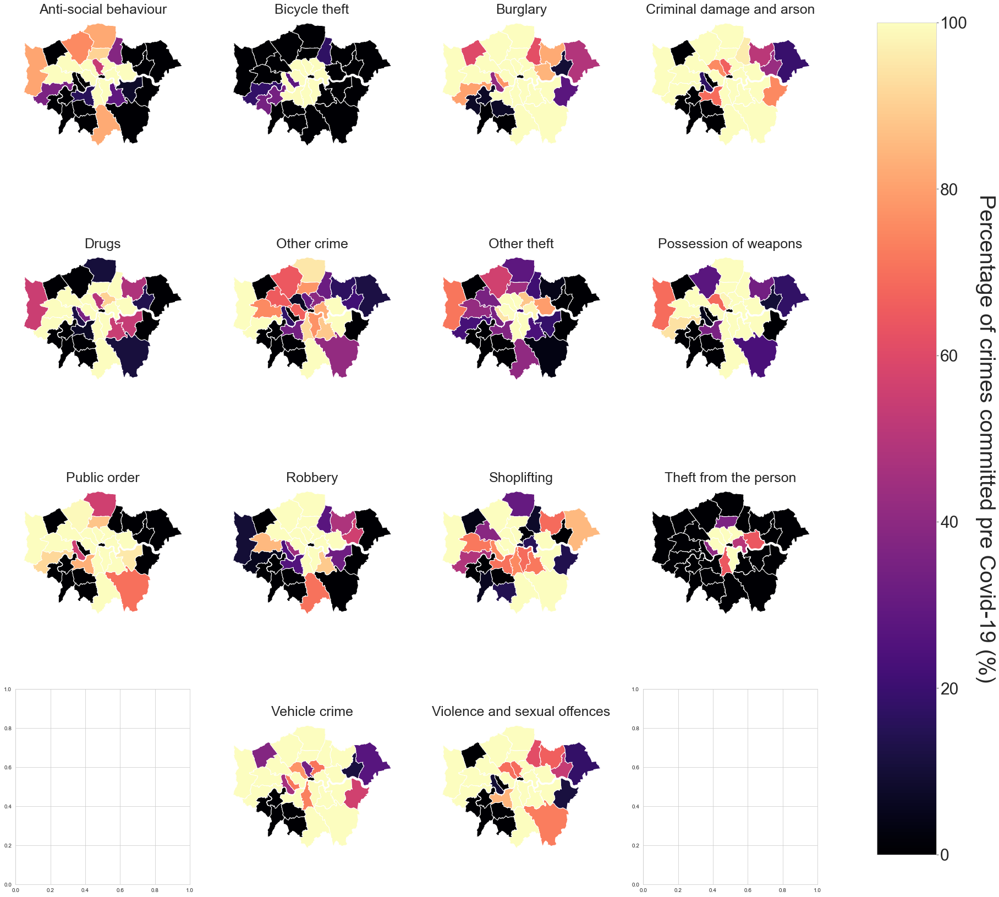

In [58]:
#create a subplot axis, given that we have 10 different categories this has to be a 3 by 4 matrix of plots
fig, axis = plt.subplots(4,4, figsize = (30,30))
#flatten the axis so that we can iterate over them
axis = axis.flatten()

#creating the plot function
#use the enumerate to get the value and its index
for i, col in enumerate(to_plot):
    #set the axis as in the rows
    ax = axis[i]
    #to make it cleaner move two axis across
    if i >=12:
        ax = axis[i+1]
    ax.set_axis_off()
    #plot the crime map using the magma color map
    crim_plt = borough_crime_pre.plot(column = col, ax=ax, cmap = "magma", vmin =0, vmax = 1)
    #remove the axis so that it looks cleaner

    #set the plot title as the column name
    ax.set_title(col, fontsize = 25)

    
#plt.subplots_adjust(right = 0.8)
#cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
#cbar = plt.colorbar(cax=cbar_ax)

#adding a color bar for the overall plto
#https://stackoverflow.com/questions/8342549/matplotlib-add-colorbar-to-a-sequence-of-line-plots/11558629#11558629
vmin, vmax = 0,100

#create a subaxis within the figure
fig = ax.get_figure()
plt.subplots_adjust(right = 0.8)
cax = fig.add_axes([0.85, 0.15, 0.05, 0.7], label = "Percentage of crime")
#create a colorbar and plot it
sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cb = fig.colorbar(sm, cax=cax)
#change the size of the tick parameters
cb.ax.tick_params(labelsize = 30)
#set the label title
#https://stackoverflow.com/questions/17475619/how-do-i-adjust-offset-colorbar-title-in-matplotlib
cb.set_label("Percentage of crimes committed pre Covid-19 (%)", rotation = 270, fontsize= 40, labelpad = 50)
#
#cax.tight_layout()

#remove axis of plots not covered
axis[8].set_axis_off()
axis[11].set_axis_off()
#show the results
plt.show()

In [59]:
# borough_crime_2020 = (borough_crime[borough_crime['YEAR']==2020]).copy()
# borough_crime_2020.reset_index(drop=True, inplace=True)
# borough_crime_2020.describe()

borough_crime_during = (borough_crime[borough_crime['covid_restrictions']=='during_covid']).copy()
borough_crime_during.reset_index(drop=True, inplace=True)
# borough_crime_during.describe()

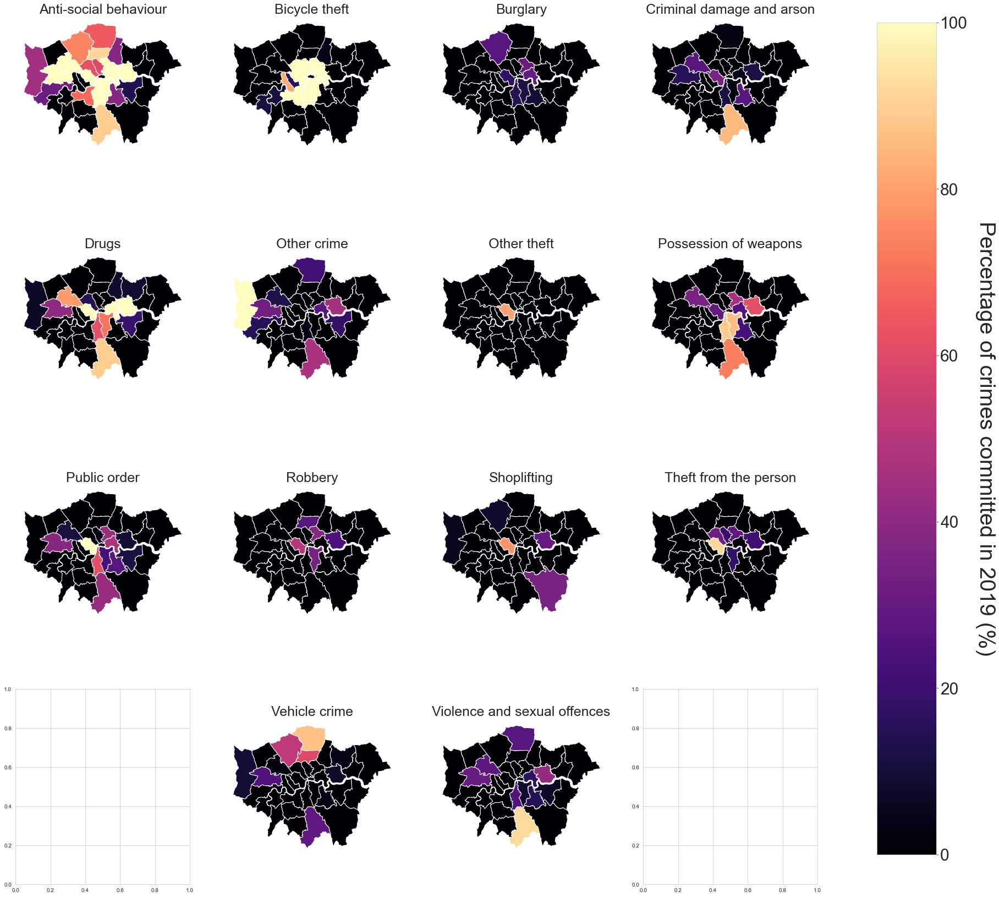

In [60]:
#create a subplot axis, given that we have 10 different categories this has to be a 3 by 4 matrix of plots
fig, axis = plt.subplots(4,4, figsize = (30,30))
#flatten the axis so that we can iterate over them
axis = axis.flatten()

#creating the plot function
#use the enumerate to get the value and its index
for i, col in enumerate(to_plot):
    #set the axis as in the rows
    ax = axis[i]
    #to make it cleaner move two axis across
    if i >=12:
        ax = axis[i+1]
    #plot the crime map using the magma color map
    crim_plt = borough_crime_during.plot(column = col, ax=ax, cmap = "magma", vmin =0, vmax = 1)
    #remove the axis so that it looks cleaner
    ax.set_axis_off()
    #set the plot title as the column name
    ax.set_title(col, fontsize = 25)

    
#plt.subplots_adjust(right = 0.8)
#cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
#cbar = plt.colorbar(cax=cbar_ax)

#adding a color bar for the overall plto
#https://stackoverflow.com/questions/8342549/matplotlib-add-colorbar-to-a-sequence-of-line-plots/11558629#11558629
vmin, vmax = 0,100

#create a subaxis within the figure
fig = ax.get_figure()
plt.subplots_adjust(right = 0.8)
cax = fig.add_axes([0.85, 0.15, 0.05, 0.7], label = "Percentage of crime")
#create a colorbar and plot it
sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cb = fig.colorbar(sm, cax=cax)
#change the size of the tick parameters
cb.ax.tick_params(labelsize = 30)
#set the label title
#https://stackoverflow.com/questions/17475619/how-do-i-adjust-offset-colorbar-title-in-matplotlib
cb.set_label("Percentage of crimes committed in 2019 (%)", rotation = 270, fontsize= 40, labelpad = 50)
#
#cax.tight_layout()

#remove axis of plots not covered
axis[8].set_axis_off()
axis[11].set_axis_off()
#show the results
plt.show()

In [61]:
# borough_crime_2021 = (borough_crime[borough_crime['YEAR']==2021]).copy()
# borough_crime_2021.reset_index(drop=True, inplace=True)
# borough_crime_2021.describe()

borough_crime_post = (borough_crime[borough_crime['covid_restrictions']=='post_covid']).copy()
borough_crime_post.reset_index(drop=True, inplace=True)
# borough_crime_post.describe()

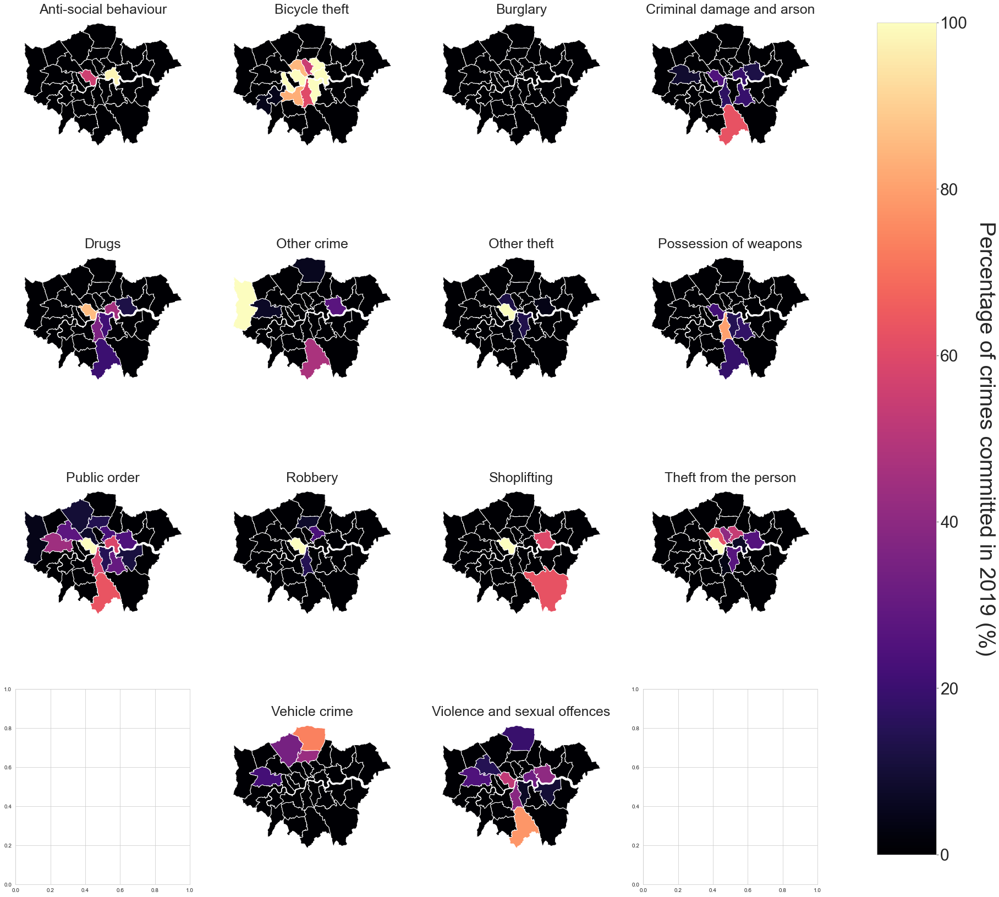

In [62]:
#create a subplot axis, given that we have 10 different categories this has to be a 3 by 4 matrix of plots
fig, axis = plt.subplots(4,4, figsize = (30,30))
#flatten the axis so that we can iterate over them
axis = axis.flatten()

#creating the plot function
#use the enumerate to get the value and its index
for i, col in enumerate(to_plot):
    #set the axis as in the rows
    ax = axis[i]
    #to make it cleaner move two axis across
    if i >=12:
        ax = axis[i+1]
    #plot the crime map using the magma color map
    crim_plt = borough_crime_post.plot(column = col, ax=ax, cmap = "magma", vmin =0, vmax = 1)
    #remove the axis so that it looks cleaner
    ax.set_axis_off()
    #set the plot title as the column name
    ax.set_title(col, fontsize = 25)

    
#plt.subplots_adjust(right = 0.8)
#cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
#cbar = plt.colorbar(cax=cbar_ax)

#adding a color bar for the overall plto
#https://stackoverflow.com/questions/8342549/matplotlib-add-colorbar-to-a-sequence-of-line-plots/11558629#11558629
vmin, vmax = 0,100

#create a subaxis within the figure
fig = ax.get_figure()
plt.subplots_adjust(right = 0.8)
cax = fig.add_axes([0.85, 0.15, 0.05, 0.7], label = "Percentage of crime")
#create a colorbar and plot it
sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cb = fig.colorbar(sm, cax=cax)
#change the size of the tick parameters
cb.ax.tick_params(labelsize = 30)
#set the label title
#https://stackoverflow.com/questions/17475619/how-do-i-adjust-offset-colorbar-title-in-matplotlib
cb.set_label("Percentage of crimes committed in 2019 (%)", rotation = 270, fontsize= 40, labelpad = 50)
#
#cax.tight_layout()

#remove axis of plots not covered
axis[8].set_axis_off()
axis[11].set_axis_off()
#show the results
plt.show()

In [63]:
borough_crime_total = (borough_crime[['Borough', 'covid_restrictions', 'geometry','Total_crime']]).copy()
borough_crime_total.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Borough             99 non-null     object  
 1   covid_restrictions  99 non-null     object  
 2   geometry            99 non-null     geometry
 3   Total_crime         99 non-null     int64   
dtypes: geometry(1), int64(1), object(2)
memory usage: 3.2+ KB


In [64]:
borough_crime_total_pre = (borough_crime_total[borough_crime_total['covid_restrictions']=='pre_covid']).copy()
# borough_crime_total_pre.Total_crime = (borough_crime_total_pre.Total_crime - borough_crime_total_pre.Total_crime.mean()) / (borough_crime_total_pre.Total_crime.max() - borough_crime_total_pre.Total_crime.min())

borough_crime_total_during = (borough_crime_total[borough_crime_total['covid_restrictions']=='during_covid']).copy()
# borough_crime_total_during.Total_crime = (borough_crime_total_during.Total_crime - borough_crime_total_during.Total_crime.mean()) / (borough_crime_total_during.Total_crime.max() - borough_crime_total_during.Total_crime.min())

borough_crime_total_post = (borough_crime_total[borough_crime_total['covid_restrictions']=='post_covid']).copy()
# borough_crime_total_post.Total_crime = (borough_crime_total_post.Total_crime - borough_crime_total_post.Total_crime.mean()) / (borough_crime_total_post.Total_crime.max() - borough_crime_total_post.Total_crime.min())

borough_crime_total_pre.reset_index(drop=True, inplace=True)
borough_crime_total_during.reset_index(drop=True, inplace=True)
borough_crime_total_post.reset_index(drop=True, inplace=True)

In [65]:
borough_crime_total.describe()

,Total_crime
count,99.000000
mean,32919.646465
std,15673.566273
min,3772.000000
25%,22701.500000
50%,30513.000000
75%,40055.000000
max,115147.000000


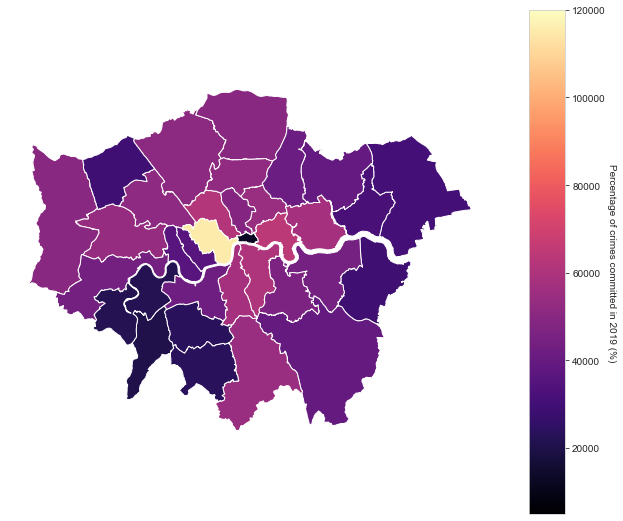

In [66]:
fig, ax = plt.subplots(figsize = (10,10))
borough_crime_total_pre.plot(column = "Total_crime", categorical = False, cmap = "magma", legend=False, ax=ax, vmin =5000, vmax = 120000)
ax.set_axis_off()
#create a subaxis within the figure
vmin, vmax = 5000,120000
fig = ax.get_figure()
plt.subplots_adjust(right = 0.8)
cax = fig.add_axes([0.85, 0.15, 0.05, 0.7], label = "Percentage of crime")
#create a colorbar and plot it
sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cb = fig.colorbar(sm, cax=cax)
#change the size of the tick parameters
cb.ax.tick_params(labelsize = 10)
#set the label title
#https://stackoverflow.com/questions/17475619/how-do-i-adjust-offset-colorbar-title-in-matplotlib
cb.set_label("Percentage of crimes committed in 2019 (%)", rotation = 270, fontsize= 10, labelpad = 10)

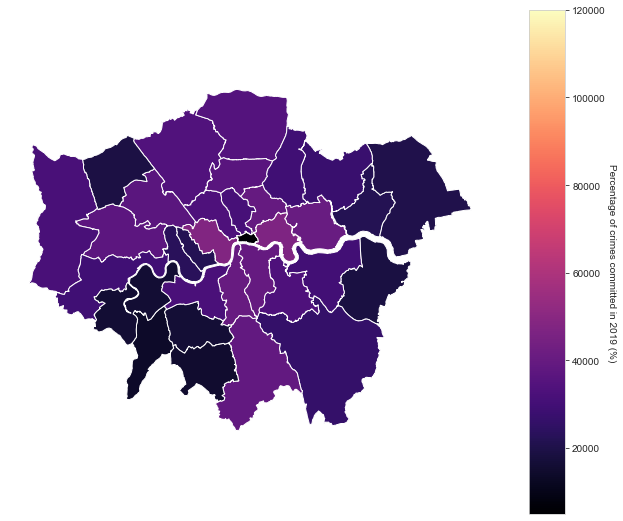

In [67]:
fig, ax = plt.subplots(figsize = (10,10))
borough_crime_total_during.plot(column = "Total_crime", categorical = False, cmap = "magma", legend=False, ax=ax, vmin =5000, vmax = 120000)
ax.set_axis_off()
#create a subaxis within the figure
vmin, vmax = 5000,120000
fig = ax.get_figure()
plt.subplots_adjust(right = 0.8)
cax = fig.add_axes([0.85, 0.15, 0.05, 0.7], label = "Percentage of crime")
#create a colorbar and plot it
sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cb = fig.colorbar(sm, cax=cax)
#change the size of the tick parameters
cb.ax.tick_params(labelsize = 10)
#set the label title
#https://stackoverflow.com/questions/17475619/how-do-i-adjust-offset-colorbar-title-in-matplotlib
cb.set_label("Percentage of crimes committed in 2019 (%)", rotation = 270, fontsize= 10, labelpad = 10)

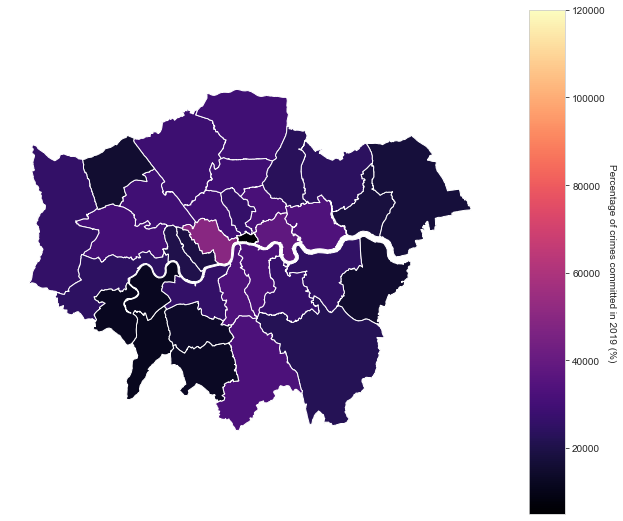

In [68]:
fig, ax = plt.subplots(figsize = (10,10))
borough_crime_total_post.plot(column = "Total_crime", categorical = False, cmap = "magma", legend=False, ax=ax, vmin =5000, vmax = 120000)
ax.set_axis_off()
#create a subaxis within the figure
vmin, vmax = 5000,120000
fig = ax.get_figure()
plt.subplots_adjust(right = 0.8)
cax = fig.add_axes([0.85, 0.15, 0.05, 0.7], label = "Percentage of crime")
#create a colorbar and plot it
sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cb = fig.colorbar(sm, cax=cax)
#change the size of the tick parameters
cb.ax.tick_params(labelsize = 10)
#set the label title
#https://stackoverflow.com/questions/17475619/how-do-i-adjust-offset-colorbar-title-in-matplotlib
cb.set_label("Percentage of crimes committed in 2019 (%)", rotation = 270, fontsize= 10, labelpad = 10)

## AgglomerativeClustering 

#### during_covid

use StandardScaler for AgglomerativeClustering

In [69]:
#import the necessary module
from sklearn.cluster import AgglomerativeClustering
#extract the values that we want to plot
crime_clus = borough_crime_during[to_plot]
crime_clus = crime_clus.reset_index(drop=True)

In [91]:
#create the model that we want, setting the linkage to ward, the distance threshold to 4 and 
#set the number of clusters to none so that we can plot the dendrogram afterwards
model6 = AgglomerativeClustering(linkage="ward", distance_threshold = 6, n_clusters=None)
#fit the model to the data
model6.fit(crime_clus)
borough_crime_during["Aggl_clus_6"] = model6.labels_

In [92]:
import contextily as cx
borough_crime_during.crs

<Derived Projected CRS: PROJCS["OSGB36 / British National Grid",GEOGCS["OS ...>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [93]:
borough_crime_during_wm = borough_crime_during.to_crs(epsg=3857)

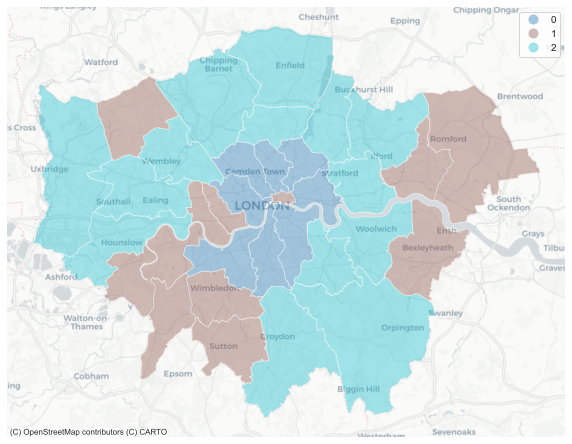

In [95]:
fig, ax = plt.subplots(figsize = (10,10))
borough_crime_during_wm.plot(column = "Aggl_clus_6", categorical = True, legend=True, ax=ax, alpha=0.4)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, zoom=10)
# cx.add_basemap(ax, source=cx.providers.Stamen.TonerLabels, zoom=10)
ax.set_axis_off()

In [96]:
agglom_means =borough_crime_during.groupby("Aggl_clus_6")[to_plot].mean()
agglom_means_T = agglom_means.T.round(3)

#agglom_means_T.reset_index(inplace=True)
agglom_means_T = pd.DataFrame(agglom_means_T)
agglom_means_T.columns

Int64Index([0, 1, 2], dtype='int64', name='Aggl_clus_6')

/var/folders/bs/71hlw4z90hq09205_mq_bww00000gn/T/ipykernel_22572/1987307669.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)


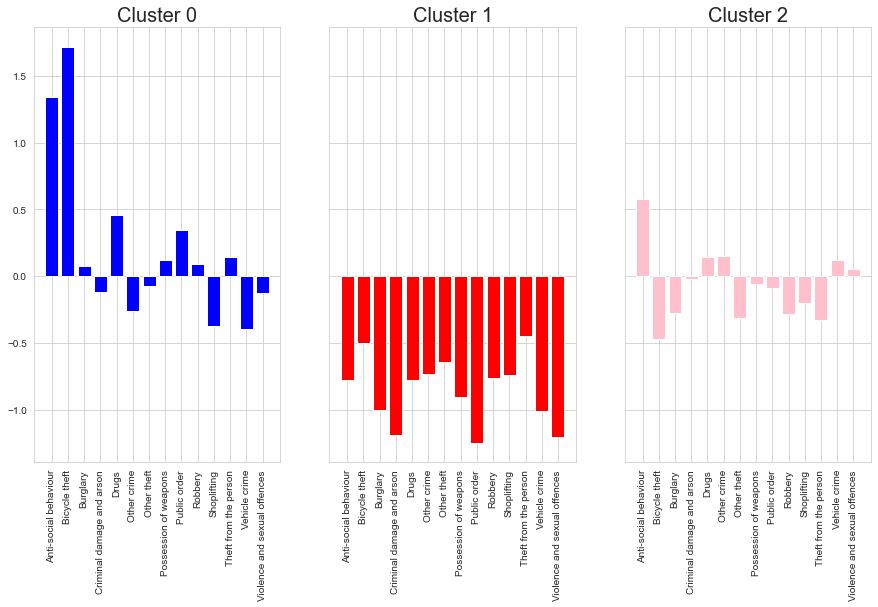

In [97]:
agglom_means_T.reset_index(inplace=True)

#get the colours
colors = ["blue", "red", "pink"]

#create subplots for each cluster
fig, ax = plt.subplots(1,3, figsize = (15,8), sharey = True, sharex = True)
#flatten the axis
axis = ax.flatten()

#going over each column
for i, col  in enumerate(agglom_means_T.columns):
    #ignore the index column
    if col != "index":
        ax = axis[i-1]
        #plot the bar chart
        ax.bar(height = agglom_means_T[col], x=agglom_means_T["index"], color = colors[i-1] )
        #rotate the x-ticks
        ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
        #set the title
        ax.set_title(f"Cluster {col}", fontsize = 20)

In [98]:
agglom_sizes = borough_crime_during.groupby("Aggl_clus_6").size()
agglom_sizes

Aggl_clus_6
0     8
1    11
2    14
dtype: int64

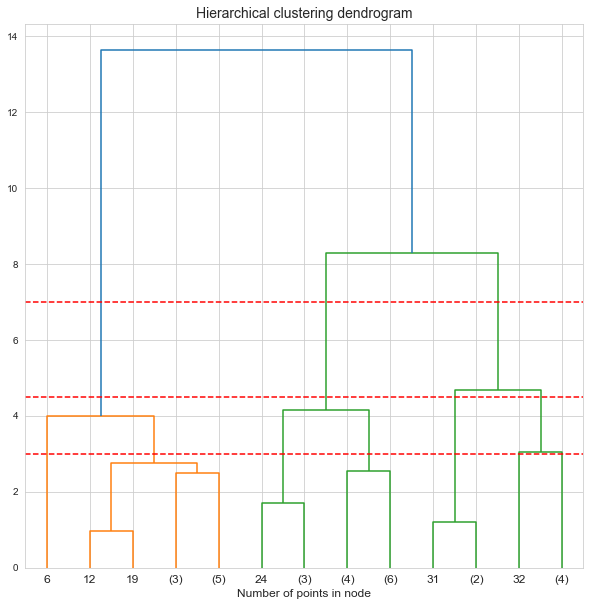

In [130]:
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count +=1
            else:
                current_count += counts[child_idx-n_samples]
        counts[i] = current_count
        
    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                     counts]).astype(float)
    
    dendrogram(linkage_matrix, **kwargs)

fig, ax = plt.subplots(figsize = (10,10))
ax.set_title("Hierarchical clustering dendrogram")
#plot the top three levels of the dendrogram
plot_dendrogram(model7, truncate_mode='level', p=3)
plt.axhline(y = 7, color = "r", linestyle = "--")
plt.axhline(y = 4.5, color = "r", linestyle = "--")
plt.axhline(y = 3, color = "r", linestyle = "--")
ax.set_xlabel("Number of points in node")
plt.show()

In [100]:
#create the model that we want, setting the linkage to ward, the distance threshold to 4 and 
#set the number of clusters to none so that we can plot the dendrogram afterwards
model45 = AgglomerativeClustering(linkage="ward", distance_threshold = 4.5, n_clusters=None)
#fit the model to the data
model45.fit(crime_clus)
borough_crime_during["Aggl_clus_45"] = model45.labels_

In [101]:
#create the model that we want, setting the linkage to ward, the distance threshold to 4 and 
#set the number of clusters to none so that we can plot the dendrogram afterwards
model38 = AgglomerativeClustering(linkage="ward", distance_threshold = 3.8, n_clusters=None)
#fit the model to the data
model38.fit(crime_clus)
borough_crime_during["Aggl_clus_38"] = model38.labels_

Text(0.5, 1.0, 'Distance threshold 3.8 cluster')

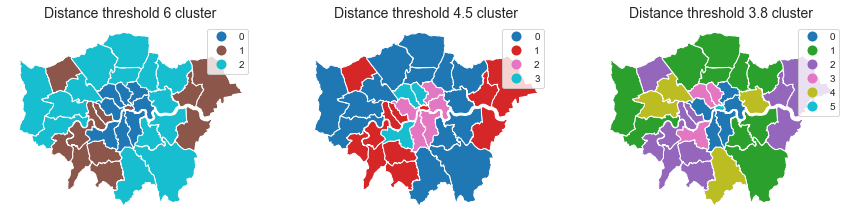

In [102]:
fig, ax = plt.subplots(1, 3, figsize = (15,30))

borough_crime_during.plot(column = "Aggl_clus_6", categorical = True, legend=True, ax=ax[0])
ax[0].set_axis_off()
ax[0].set_title("Distance threshold 6 cluster")

borough_crime_during.plot(column = "Aggl_clus_45", categorical = True, legend=True, ax=ax[1])
ax[1].set_axis_off()
ax[1].set_title("Distance threshold 4.5 cluster")

borough_crime_during.plot(column = "Aggl_clus_38", categorical = True, legend=True, ax=ax[2])
ax[2].set_axis_off()
ax[2].set_title("Distance threshold 3.8 cluster")

Text(0.5, 1.0, 'Clusters with distance threshold 3.8')

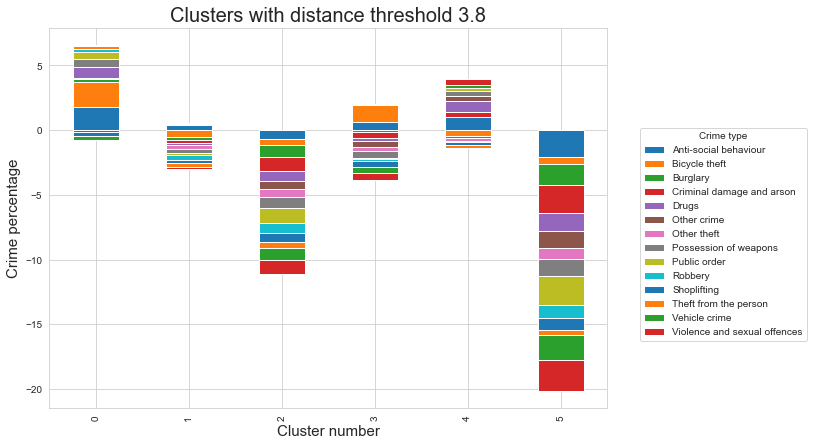

In [105]:
agglom_means =borough_crime_during.groupby("Aggl_clus_38")[to_plot].mean()
agglom_means_T = agglom_means.T.round(3)

agglom_means_T = pd.DataFrame(agglom_means_T)

agglom_means_T.reset_index(inplace=True)

agglom_means_T.set_index('index', inplace=True)
agglom_means_T.rename_axis(None,axis=1, inplace=True)
agglom_means_T.T

fig, ax = plt.subplots(figsize = (10,10))

agglom_plot = agglom_means_T.T.plot.bar(stacked=True, figsize=(10,7), ax=ax)
agglom_plot.legend(title='Crime type', bbox_to_anchor=(1.05, 0.75), loc='upper left')
ax.set_xlabel("Cluster number", fontsize = 15)
ax.set_ylabel("Crime percentage", fontsize = 15)
ax.set_title("Clusters with distance threshold 3.8", fontsize = 20)

Text(0.5, 1.0, 'Clusters with distance threshold 4.5')

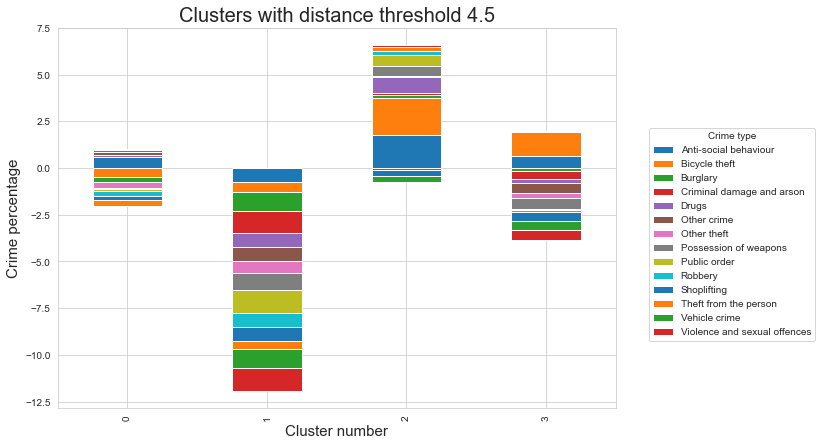

In [106]:
agglom_means =borough_crime_during.groupby("Aggl_clus_45")[to_plot].mean()
agglom_means_T = agglom_means.T.round(3)

agglom_means_T = pd.DataFrame(agglom_means_T)

agglom_means_T.reset_index(inplace=True)

agglom_means_T.set_index('index', inplace=True)
agglom_means_T.rename_axis(None,axis=1, inplace=True)
agglom_means_T.T

fig, ax = plt.subplots(figsize = (10,10))

agglom_plot = agglom_means_T.T.plot.bar(stacked=True, figsize=(10,7), ax=ax)
agglom_plot.legend(title='Crime type', bbox_to_anchor=(1.05, 0.75), loc='upper left')
ax.set_xlabel("Cluster number", fontsize = 15)
ax.set_ylabel("Crime percentage", fontsize = 15)
ax.set_title("Clusters with distance threshold 4.5", fontsize = 20)

In [107]:
agglom_sizes = borough_crime_during.groupby("Aggl_clus_38").size()
agglom_sizes

Aggl_clus_38
0     5
1    10
2    10
3     3
4     4
5     1
dtype: int64

In [108]:
#import the necessary packages
from libpysal import weights

#calculate the weights matrix
wr = weights.contiguity.Rook.from_dataframe(borough_crime_during) 

# 

/Users/mammej/opt/anaconda3/envs/VA_coursework/lib/python3.8/site-packages/libpysal/weights/_contW_lists.py:31: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  return list(it.chain(*(_get_boundary_points(part.boundary) for part in shape)))


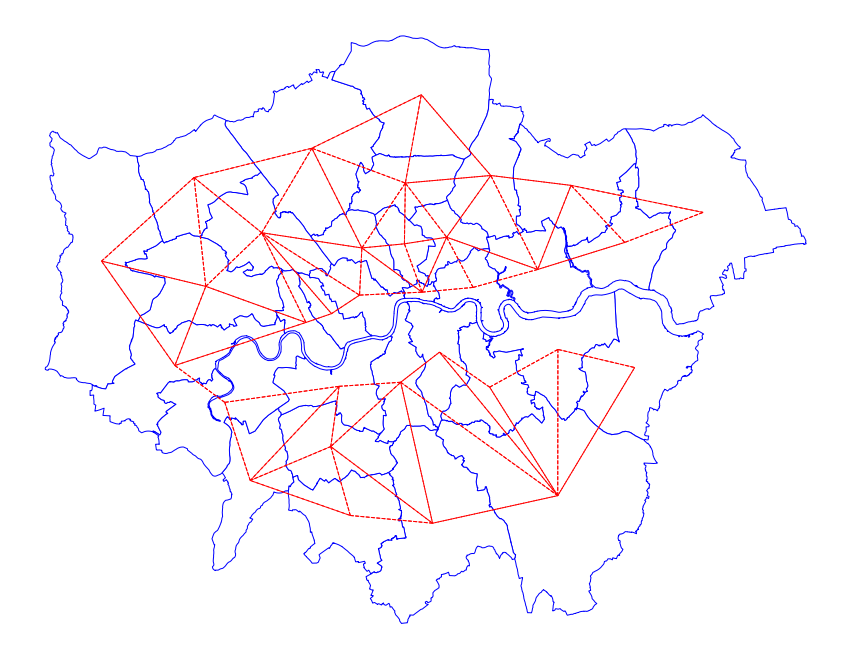

In [109]:
#looking at London
fig, ax = plt.subplots(figsize = (15,15))

borough_crime_during.plot(edgecolor = "blue", facecolor = "w", ax=ax)

wr.plot(borough_crime_during, ax=ax,
       edge_kws=dict(color="r", linestyle = "--", linewidth =1),
       node_kws=dict(marker=''))

ax.set_axis_off()

In [110]:
#code from: https://geographicdata.science/book/notebooks/10_clustering_and_regionalization.html

#import Moran
from esda.moran import Moran

#extract the resutls for each column
mi_results = [Moran(borough_crime_during[col], wr) for col in to_plot]

#create a table based on this
#extract the variable, and results from the zipped list
table = pd.DataFrame([(to_plot, res.I, res.p_sim) \
                          for to_plot,res \
                          in zip(to_plot, mi_results)
                         ], 
                     #set the columns
                     columns=['Variable', "Moran's I", 'P-value'])\
              .set_index('Variable')
#set the index to the variable

#sort the tables values 
table.sort_values(by= ["Moran's I"], ascending=False)

,Moran's I,P-value
Variable,,
Bicycle theft,0.231901,0.025
Theft from the person,0.215146,0.026
Vehicle crime,0.186916,0.028
Possession of weapons,0.158150,0.054
Robbery,0.154305,0.064
Other crime,0.120347,0.117
Burglary,0.036567,0.260
Other theft,0.027707,0.311
Violence and sexual offences,0.006267,0.363


In [127]:
#create the model with wards linkage
model = AgglomerativeClustering(linkage="ward", 
                                #define the connectivity
                                connectivity = wr.sparse,
                                #set the distance threshold
                                distance_threshold = 4.5, 
                                n_clusters=None)

#fit the model
model.fit(crime_clus)

AgglomerativeClustering(connectivity=<33x33 sparse matrix of type '<class 'numpy.float64'>'
	with 136 stored elements in Compressed Sparse Row format>,
                        distance_threshold=4.5, n_clusters=None)

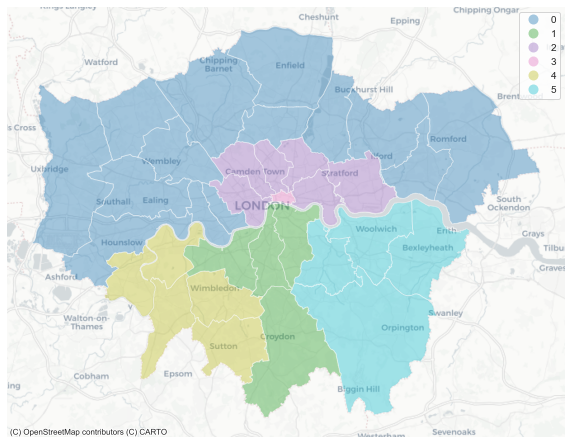

In [128]:
#extract labels
borough_crime_during["Aggl_clus_spa"] = model.labels_

# #creating axis
# fig, ax =plt.subplots(figsize = (10,10))

# #plt the results
# borough_crime_2020.plot(column = "Aggl_clus_spa", categorical = True, legend=True, ax = ax)
# ax.set_axis_off()

borough_crime_during_wm = borough_crime_during.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize = (10,10))
borough_crime_during_wm.plot(column = "Aggl_clus_spa", categorical = True, legend=True, ax=ax, alpha=0.4)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, zoom=10)
# cx.add_basemap(ax, source=cx.providers.Stamen.TonerLabels, zoom=10)
ax.set_axis_off()

Text(0.5, 1.0, 'Clusters with distance threshold 6')

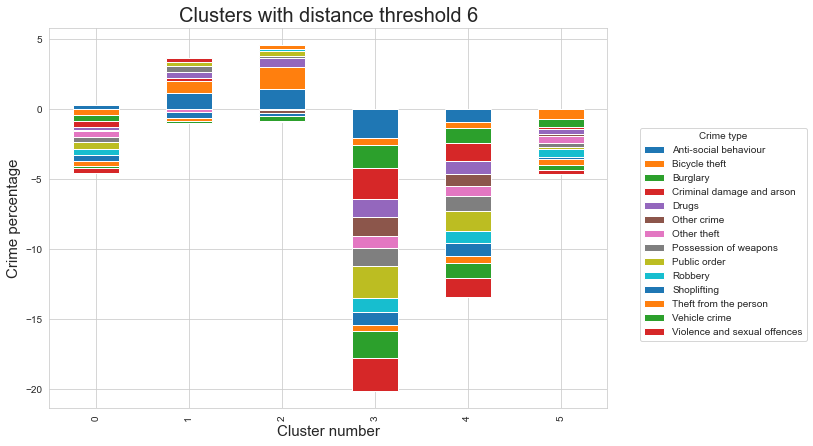

In [120]:
agglom_means =borough_crime_during.groupby("Aggl_clus_spa")[to_plot].mean()
agglom_means_T = pd.DataFrame(agglom_means.T.round(3))
agglom_means_T.reset_index(inplace=True)
agglom_means_T.set_index('index', inplace=True)
agglom_means_T.rename_axis(None,axis=1, inplace=True)
agglom_means_T.T

fig, ax = plt.subplots(figsize = (10,10))

agglom_plot = agglom_means_T.T.plot.bar(stacked=True, figsize=(10,7), ax=ax)
agglom_plot.legend(title='Crime type', bbox_to_anchor=(1.05, 0.75), loc='upper left')
ax.set_xlabel("Cluster number", fontsize = 15)
ax.set_ylabel("Crime percentage", fontsize = 15)
ax.set_title("Clusters with distance threshold 6", fontsize = 20)

/var/folders/bs/71hlw4z90hq09205_mq_bww00000gn/T/ipykernel_22572/3617886726.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)


Text(0.5, 0.98, 'Clusters with distance threshold 4.5')

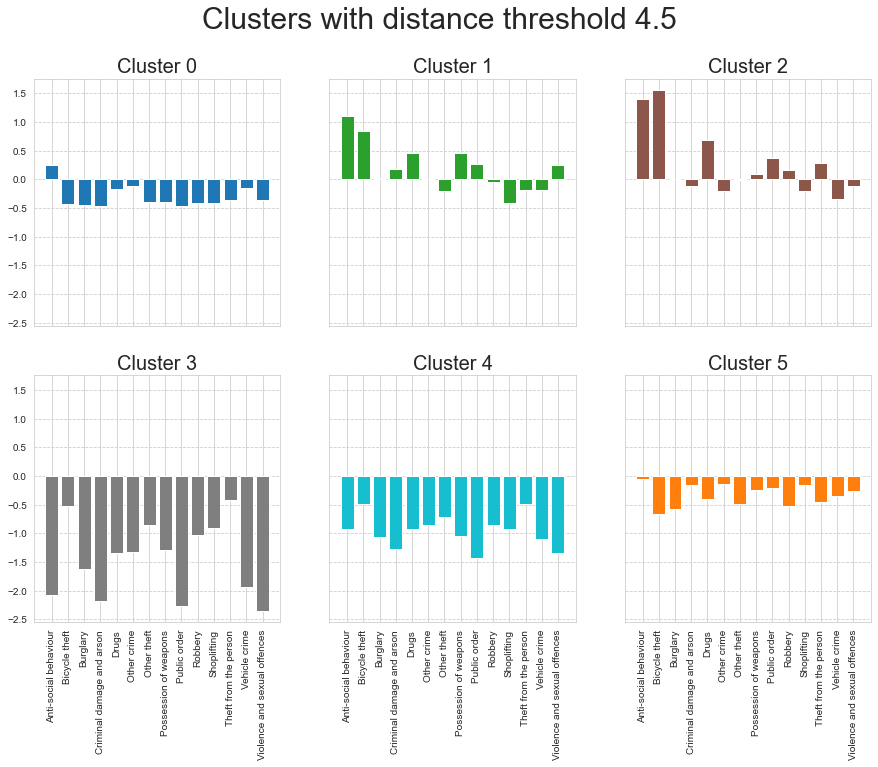

In [132]:
agglom_means =borough_crime_during.groupby("Aggl_clus_spa")[to_plot].mean()

agglom_means_T = pd.DataFrame(agglom_means.T.round(3))

agglom_means_T.reset_index(inplace=True)

colors = ["tab:blue", "tab:green", "tab:brown", "tab:grey", "tab:cyan", 'tab:orange']

fig, ax = plt.subplots(2, 3, figsize = (15,10), sharey = True, sharex = True)
axis = ax.flatten()
for i, col  in enumerate(agglom_means_T.columns):
    if col != "index":
        ax = axis[i-1]
        ax.bar(height = agglom_means_T[col], x=agglom_means_T["index"],
               color = colors[i-1])
        ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
        ax.set_title(f"Cluster {col}", fontsize = 20)
        ax.grid(axis = "y", zorder = 0, linestyle = "--")

axis[5].set_axis_on()

plt.suptitle("Clusters with distance threshold 4.5", fontsize = 30)

In [122]:
agglom_sizes = borough_crime_during.groupby("Aggl_clus_spa").size()
agglom_sizes

Aggl_clus_spa
0    14
1     4
2     6
3     1
4     4
5     4
dtype: int64

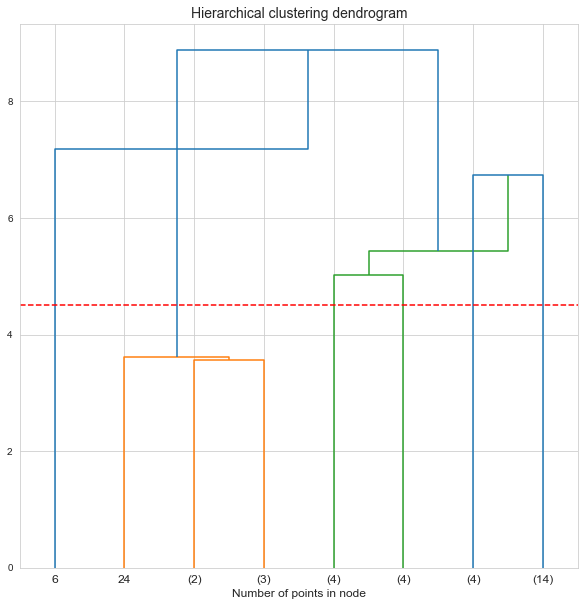

In [124]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count +=1
            else:
                current_count += counts[child_idx-n_samples]
        counts[i] = current_count
        
    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                     counts]).astype(float)
    
    dendrogram(linkage_matrix, **kwargs)

fig, ax = plt.subplots(figsize = (10,10))
ax.set_title("Hierarchical clustering dendrogram")
#plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
ax.set_xlabel("Number of points in node")
ax.axhline(y = 4.5, color = "r", linestyle = "--")
plt.show()

In [621]:
borough_crime_during.head()

,NAME,geometry,Borough,covid_restrictions,Anti-social behaviour,Bicycle theft,Burglary,Criminal damage and arson,Drugs,Other crime,Other theft,Possession of weapons,Public order,Robbery,Shoplifting,Theft from the person,Vehicle crime,Violence and sexual offences,Total_crime,Aggl_clus_7,Aggl_clus_6,Aggl_clus_45,Aggl_clus_spa
0,Barking and Dagenham,"MULTIPOLYGON (((543905.400 183199.100, 543905....",Barking and Dagenham,during_covid,-0.249818,-0.835866,-0.724856,-0.328303,0.206131,0.059293,-0.454107,-0.101850,-0.622412,-0.326694,-0.501755,-0.360084,-0.619120,-0.125927,25871,1,1,2,3
1,Barnet,"POLYGON ((524579.900 198355.200, 524594.300 19...",Barnet,during_covid,1.073434,-0.571996,0.677188,0.334212,-0.316672,0.262077,-0.125256,-0.429530,0.452316,-0.268204,0.406143,-0.336145,1.013911,0.332493,40792,2,2,1,0
2,Bexley,"POLYGON ((547226.200 181299.300, 547320.900 18...",Bexley,during_covid,-0.370221,-1.018107,-0.988399,-0.223853,-0.654289,-0.207527,-0.613835,-0.626137,-0.539148,-0.818016,-0.584812,-0.512336,-0.630561,-0.420477,22120,1,1,2,1
3,Brent,"POLYGON ((525201.000 182512.600, 525181.500 18...",Brent,during_covid,1.296814,-0.412535,0.021846,0.689344,1.071589,0.443515,-0.140915,0.600320,0.645058,-0.047239,-0.299841,-0.271032,0.285912,0.804191,42789,2,2,1,0
4,Bromley,"POLYGON ((540373.600 157530.400, 540361.200 15...",Bromley,during_covid,0.273100,-0.871934,-0.413877,0.237222,-0.270061,0.171358,-0.426964,-0.148662,0.147013,-0.589253,0.754122,-0.412750,0.219073,-0.055347,31630,2,2,1,1


#### pre_covid

In [556]:
#import the necessary module
from sklearn.cluster import AgglomerativeClustering
#extract the values that we want to plot
crime_clus = borough_crime_pre[to_plot]
crime_clus = crime_clus.reset_index(drop=True)

In [557]:
#create the model that we want, setting the linkage to ward, the distance threshold to 4 and 
#set the number of clusters to none so that we can plot the dendrogram afterwards
model7 = AgglomerativeClustering(linkage="ward", distance_threshold = 7, n_clusters=None)
#fit the model to the data
model7.fit(crime_clus)
borough_crime_pre["Aggl_clus_7"] = model7.labels_

/Users/mammej/opt/anaconda3/envs/VA_coursework/lib/python3.8/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [558]:
import contextily as cx
borough_crime_pre.crs

<Derived Projected CRS: PROJCS["OSGB36 / British National Grid",GEOGCS["OS ...>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [559]:
borough_crime_pre_wm = borough_crime_pre.to_crs(epsg=3857)

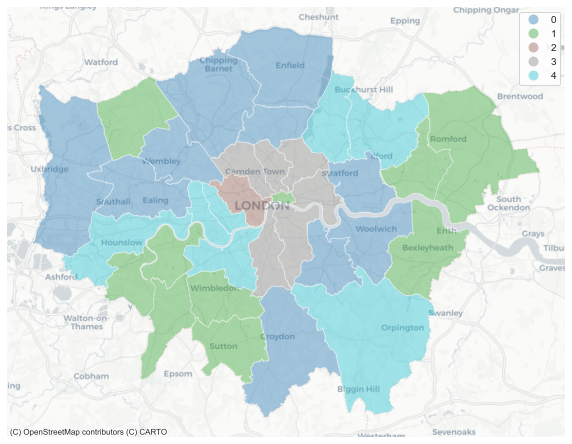

In [560]:
fig, ax = plt.subplots(figsize = (10,10))
borough_crime_pre_wm.plot(column = "Aggl_clus_7", categorical = True, legend=True, ax=ax, alpha=0.4)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, zoom=10)
# cx.add_basemap(ax, source=cx.providers.Stamen.TonerLabels, zoom=10)
ax.set_axis_off()

In [561]:
agglom_means =borough_crime_during.groupby("Aggl_clus_7")[to_plot].mean()
agglom_means_T = agglom_means.T.round(3)

#agglom_means_T.reset_index(inplace=True)
agglom_means_T = pd.DataFrame(agglom_means_T)
agglom_means_T.columns

Int64Index([0, 1, 2, 3], dtype='int64', name='Aggl_clus_7')

/var/folders/bs/71hlw4z90hq09205_mq_bww00000gn/T/ipykernel_12216/2910956105.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)


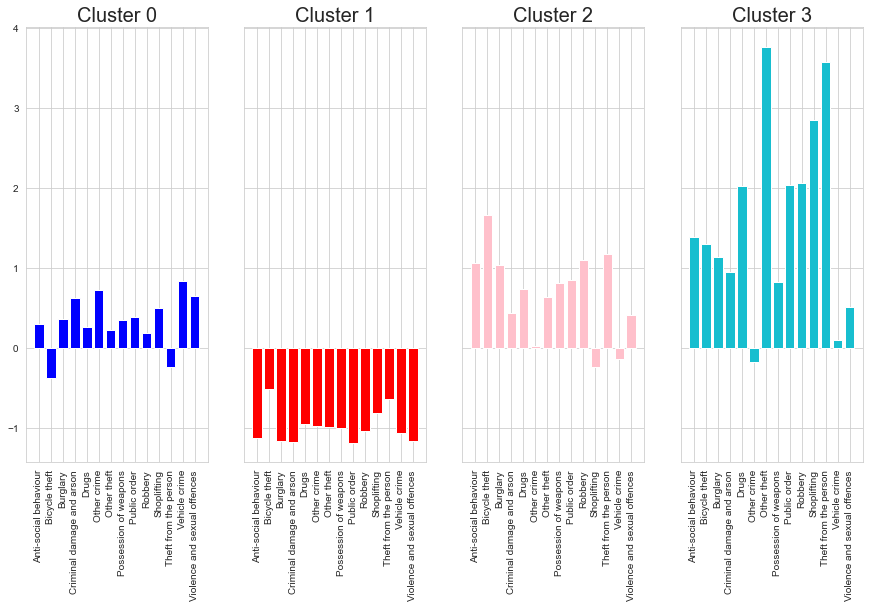

In [562]:
agglom_means_T.reset_index(inplace=True)

#get the colours
colors = ["blue", "red", "pink", "tab:cyan"]

#create subplots for each cluster
fig, ax = plt.subplots(1,4, figsize = (15,8), sharey = True, sharex = True)
#flatten the axis
axis = ax.flatten()

#going over each column
for i, col  in enumerate(agglom_means_T.columns):
    #ignore the index column
    if col != "index":
        ax = axis[i-1]
        #plot the bar chart
        ax.bar(height = agglom_means_T[col], x=agglom_means_T["index"], color = colors[i-1] )
        #rotate the x-ticks
        ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
        #set the title
        ax.set_title(f"Cluster {col}", fontsize = 20)

In [563]:
agglom_sizes = borough_crime_pre.groupby("Aggl_clus_7").size()
agglom_sizes

Aggl_clus_7
0    10
1     9
2     1
3     6
4     7
dtype: int64

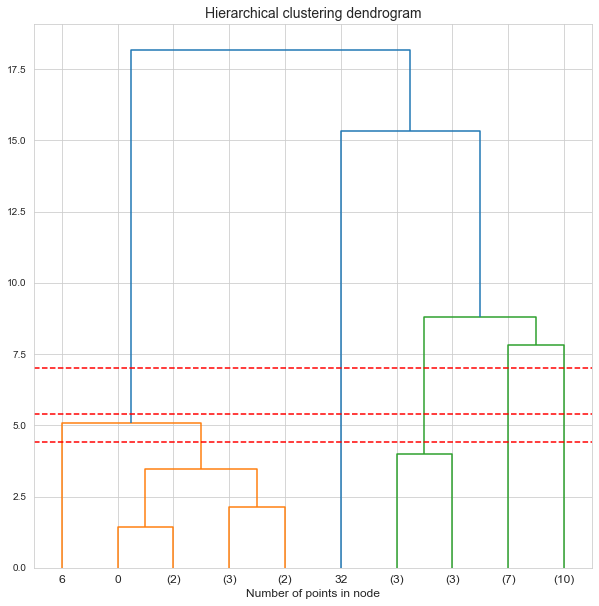

In [564]:
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count +=1
            else:
                current_count += counts[child_idx-n_samples]
        counts[i] = current_count
        
    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                     counts]).astype(float)
    
    dendrogram(linkage_matrix, **kwargs)

fig, ax = plt.subplots(figsize = (10,10))
ax.set_title("Hierarchical clustering dendrogram")
#plot the top three levels of the dendrogram
plot_dendrogram(model7, truncate_mode='level', p=3)
plt.axhline(y = 7, color = "r", linestyle = "--")
plt.axhline(y = 5.4, color = "r", linestyle = "--")
plt.axhline(y = 4.4, color = "r", linestyle = "--")
ax.set_xlabel("Number of points in node")
plt.show()

In [565]:
#create the model that we want, setting the linkage to ward, the distance threshold to 4 and 
#set the number of clusters to none so that we can plot the dendrogram afterwards
model6 = AgglomerativeClustering(linkage="ward", distance_threshold = 5.4, n_clusters=None)
#fit the model to the data
model6.fit(crime_clus)
borough_crime_pre["Aggl_clus_6"] = model6.labels_

/Users/mammej/opt/anaconda3/envs/VA_coursework/lib/python3.8/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [566]:
#create the model that we want, setting the linkage to ward, the distance threshold to 4 and 
#set the number of clusters to none so that we can plot the dendrogram afterwards
model45 = AgglomerativeClustering(linkage="ward", distance_threshold = 4.4, n_clusters=None)
#fit the model to the data
model45.fit(crime_clus)
borough_crime_pre["Aggl_clus_45"] = model45.labels_

/Users/mammej/opt/anaconda3/envs/VA_coursework/lib/python3.8/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Text(0.5, 1.0, 'Distance threshold 4.5 cluster')

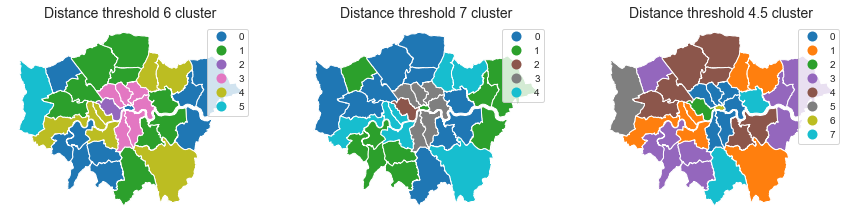

In [567]:
fig, ax = plt.subplots(1, 3, figsize = (15,30))

borough_crime_pre.plot(column = "Aggl_clus_6", categorical = True, legend=True, ax=ax[0])
ax[0].set_axis_off()
ax[0].set_title("Distance threshold 6 cluster")

borough_crime_pre.plot(column = "Aggl_clus_7", categorical = True, legend=True, ax=ax[1])
ax[1].set_axis_off()
ax[1].set_title("Distance threshold 7 cluster")

borough_crime_pre.plot(column = "Aggl_clus_45", categorical = True, legend=True, ax=ax[2])
ax[2].set_axis_off()
ax[2].set_title("Distance threshold 4.5 cluster")

Text(0.5, 1.0, 'Clusters with distance threshold 6')

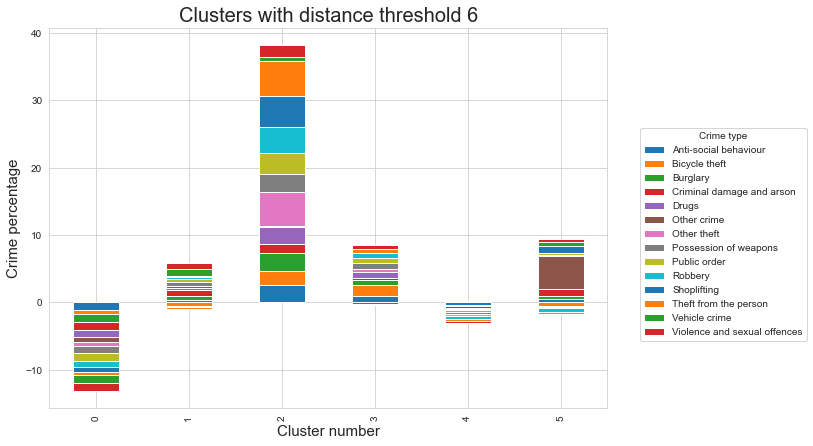

In [569]:
agglom_means =borough_crime_pre.groupby("Aggl_clus_6")[to_plot].mean()
agglom_means_T = agglom_means.T.round(3)

agglom_means_T = pd.DataFrame(agglom_means_T)

agglom_means_T.reset_index(inplace=True)

agglom_means_T.set_index('index', inplace=True)
agglom_means_T.rename_axis(None,axis=1, inplace=True)
agglom_means_T.T

fig, ax = plt.subplots(figsize = (10,10))

agglom_plot = agglom_means_T.T.plot.bar(stacked=True, figsize=(10,7), ax=ax)
agglom_plot.legend(title='Crime type', bbox_to_anchor=(1.05, 0.75), loc='upper left')
ax.set_xlabel("Cluster number", fontsize = 15)
ax.set_ylabel("Crime percentage", fontsize = 15)
ax.set_title("Clusters with distance threshold 6", fontsize = 20)

Text(0.5, 1.0, 'Clusters with distance threshold 4.5')

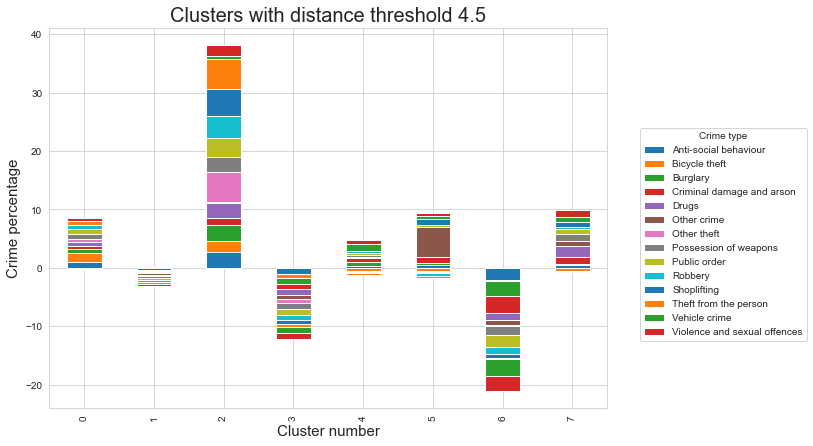

In [570]:
agglom_means =borough_crime_pre.groupby("Aggl_clus_45")[to_plot].mean()
agglom_means_T = agglom_means.T.round(3)

agglom_means_T = pd.DataFrame(agglom_means_T)

agglom_means_T.reset_index(inplace=True)

agglom_means_T.set_index('index', inplace=True)
agglom_means_T.rename_axis(None,axis=1, inplace=True)
agglom_means_T.T

fig, ax = plt.subplots(figsize = (10,10))

agglom_plot = agglom_means_T.T.plot.bar(stacked=True, figsize=(10,7), ax=ax)
agglom_plot.legend(title='Crime type', bbox_to_anchor=(1.05, 0.75), loc='upper left')
ax.set_xlabel("Cluster number", fontsize = 15)
ax.set_ylabel("Crime percentage", fontsize = 15)
ax.set_title("Clusters with distance threshold 4.5", fontsize = 20)

In [571]:
agglom_sizes = borough_crime_pre.groupby("Aggl_clus_6").size()
agglom_sizes

Aggl_clus_6
0    9
1    9
2    1
3    6
4    7
5    1
dtype: int64

In [572]:
#import the necessary packages
from libpysal import weights

#calculate the weights matrix
wr = weights.contiguity.Rook.from_dataframe(borough_crime_pre) 

# 

/Users/mammej/opt/anaconda3/envs/VA_coursework/lib/python3.8/site-packages/libpysal/weights/_contW_lists.py:31: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  return list(it.chain(*(_get_boundary_points(part.boundary) for part in shape)))


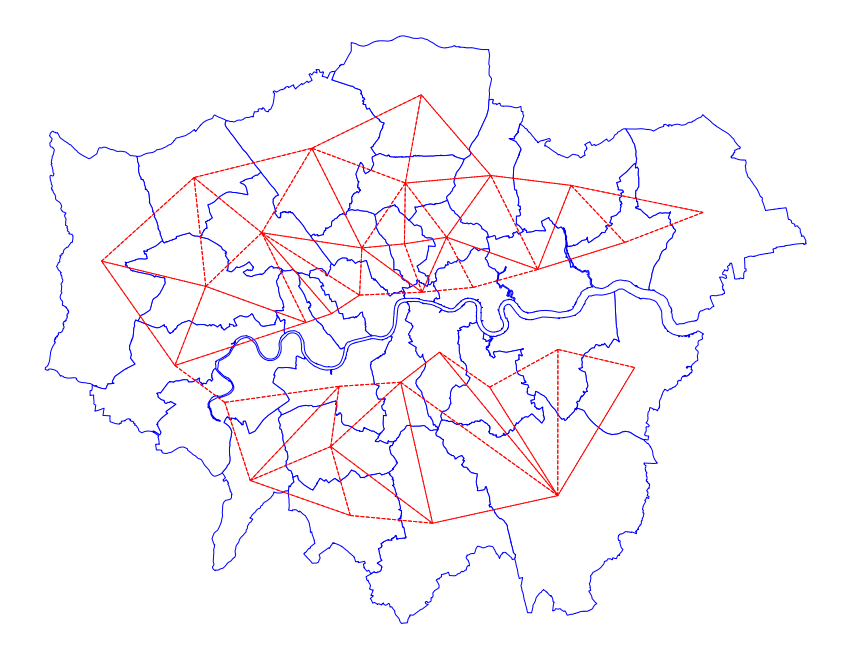

In [573]:
#looking at London
fig, ax = plt.subplots(figsize = (15,15))

borough_crime_pre.plot(edgecolor = "blue", facecolor = "w", ax=ax)

wr.plot(borough_crime_during, ax=ax,
       edge_kws=dict(color="r", linestyle = "--", linewidth =1),
       node_kws=dict(marker=''))

ax.set_axis_off()

In [574]:
#code from: https://geographicdata.science/book/notebooks/10_clustering_and_regionalization.html

#import Moran
from esda.moran import Moran

#extract the resutls for each column
mi_results = [Moran(borough_crime_pre[col], wr) for col in to_plot]

#create a table based on this
#extract the variable, and results from the zipped list
table = pd.DataFrame([(to_plot, res.I, res.p_sim) \
                          for to_plot,res \
                          in zip(to_plot, mi_results)
                         ], 
                     #set the columns
                     columns=['Variable', "Moran's I", 'P-value'])\
              .set_index('Variable')
#set the index to the variable

#sort the tables values 
table.sort_values(by= ["Moran's I"], ascending=False)

,Moran's I,P-value
Variable,,
Bicycle theft,0.240762,0.015
Vehicle crime,0.178509,0.043
Other theft,0.147594,0.022
Robbery,0.134705,0.082
Theft from the person,0.119535,0.034
Drugs,0.058176,0.219
Criminal damage and arson,0.047545,0.249
Possession of weapons,0.042977,0.234
Burglary,0.016190,0.318


In [575]:
#create the model with wards linkage
model = AgglomerativeClustering(linkage="ward", 
                                #define the connectivity
                                connectivity = wr.sparse,
                                #set the distance threshold
                                distance_threshold = 7.5, 
                                n_clusters=None)

#fit the model
model.fit(crime_clus)

AgglomerativeClustering(connectivity=<33x33 sparse matrix of type '<class 'numpy.float64'>'
	with 136 stored elements in Compressed Sparse Row format>,
                        distance_threshold=7.5, n_clusters=None)

/Users/mammej/opt/anaconda3/envs/VA_coursework/lib/python3.8/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


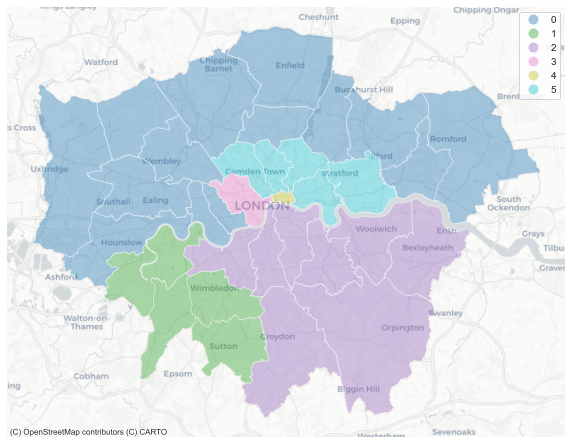

In [576]:
#extract labels
borough_crime_pre["Aggl_clus_spa"] = model.labels_

# #creating axis
# fig, ax =plt.subplots(figsize = (10,10))

# #plt the results
# borough_crime_2020.plot(column = "Aggl_clus_spa", categorical = True, legend=True, ax = ax)
# ax.set_axis_off()

borough_crime_pre_wm = borough_crime_pre.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize = (10,10))
borough_crime_pre_wm.plot(column = "Aggl_clus_spa", categorical = True, legend=True, ax=ax, alpha=0.4)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, zoom=10)
# cx.add_basemap(ax, source=cx.providers.Stamen.TonerLabels, zoom=10)
ax.set_axis_off()

Text(0.5, 1.0, 'Clusters with distance threshold 6')

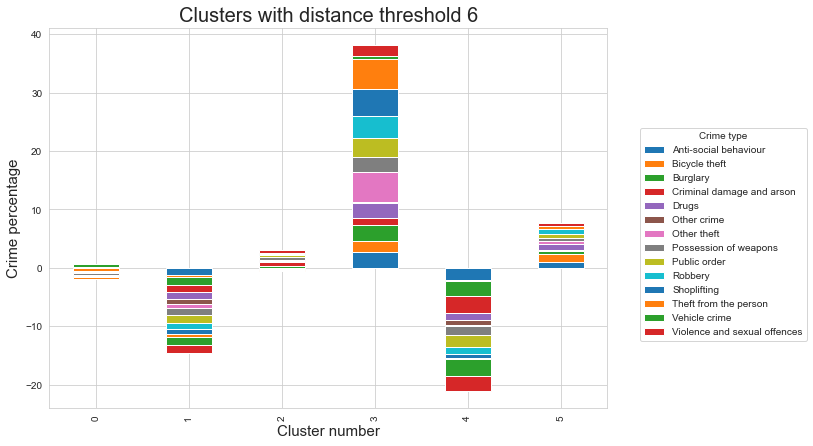

In [577]:
agglom_means =borough_crime_pre.groupby("Aggl_clus_spa")[to_plot].mean()
agglom_means_T = pd.DataFrame(agglom_means.T.round(3))
agglom_means_T.reset_index(inplace=True)
agglom_means_T.set_index('index', inplace=True)
agglom_means_T.rename_axis(None,axis=1, inplace=True)
agglom_means_T.T

fig, ax = plt.subplots(figsize = (10,10))

agglom_plot = agglom_means_T.T.plot.bar(stacked=True, figsize=(10,7), ax=ax)
agglom_plot.legend(title='Crime type', bbox_to_anchor=(1.05, 0.75), loc='upper left')
ax.set_xlabel("Cluster number", fontsize = 15)
ax.set_ylabel("Crime percentage", fontsize = 15)
ax.set_title("Clusters with distance threshold 6", fontsize = 20)

/var/folders/bs/71hlw4z90hq09205_mq_bww00000gn/T/ipykernel_12216/3635737132.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)


Text(0.5, 0.98, 'Clusters with distance threshold 6')

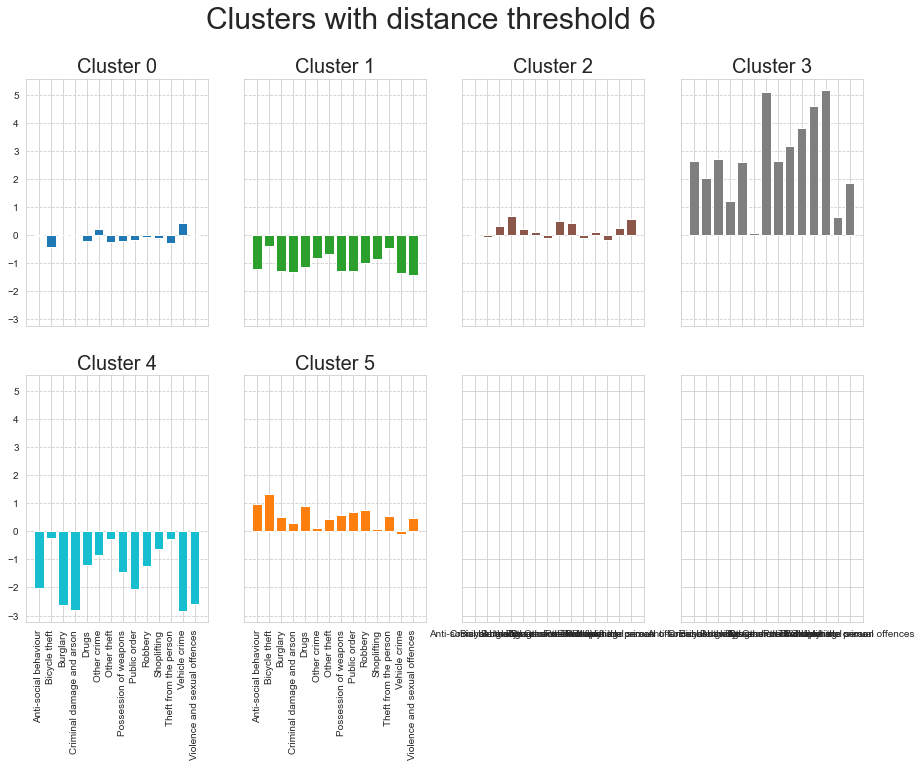

In [578]:
agglom_means =borough_crime_pre.groupby("Aggl_clus_spa")[to_plot].mean()

agglom_means_T = pd.DataFrame(agglom_means.T.round(3))

agglom_means_T.reset_index(inplace=True)

colors = ["tab:blue", "tab:green", "tab:brown", "tab:grey", "tab:cyan", 'tab:orange', 'tab:red', 'tab:purple']

fig, ax = plt.subplots(2,4, figsize = (15,10), sharey = True, sharex = True)
axis = ax.flatten()
for i, col  in enumerate(agglom_means_T.columns):
    if col != "index":
        ax = axis[i-1]
        ax.bar(height = agglom_means_T[col], x=agglom_means_T["index"],
               color = colors[i-1])
        ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
        ax.set_title(f"Cluster {col}", fontsize = 20)
        ax.grid(axis = "y", zorder = 0, linestyle = "--")

axis[5].set_axis_on()

plt.suptitle("Clusters with distance threshold 6", fontsize = 30)

In [580]:
agglom_sizes = borough_crime_pre.groupby("Aggl_clus_spa").size()
agglom_sizes

Aggl_clus_spa
0    14
1     4
2     8
3     1
4     1
5     5
dtype: int64

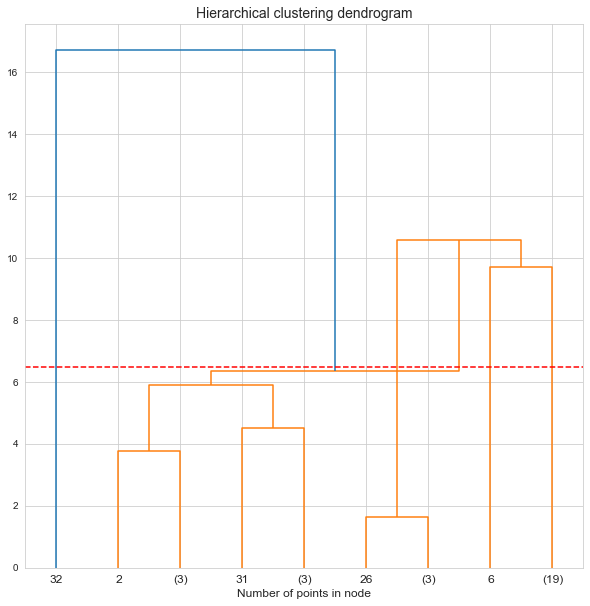

In [581]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count +=1
            else:
                current_count += counts[child_idx-n_samples]
        counts[i] = current_count
        
    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                     counts]).astype(float)
    
    dendrogram(linkage_matrix, **kwargs)

fig, ax = plt.subplots(figsize = (10,10))
ax.set_title("Hierarchical clustering dendrogram")
#plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
ax.set_xlabel("Number of points in node")
ax.axhline(y = 6.5, color = "r", linestyle = "--")
plt.show()

In [549]:
borough_crime_during.head()

,NAME,geometry,Borough,covid_restrictions,Anti-social behaviour,Bicycle theft,Burglary,Criminal damage and arson,Drugs,Other crime,Other theft,Possession of weapons,Public order,Robbery,Shoplifting,Theft from the person,Vehicle crime,Violence and sexual offences,Total_crime,Aggl_clus_7,Aggl_clus_6,Aggl_clus_45,Aggl_clus_spa
0,Barking and Dagenham,"MULTIPOLYGON (((543905.400 183199.100, 543905....",Barking and Dagenham,during_covid,-0.887939,-0.925331,-0.963501,-0.434966,-0.033347,0.049877,-0.623872,-0.080978,-0.863971,-0.238763,-0.652461,-0.457813,-0.793861,-0.201836,28463,1,2,2,0
1,Barnet,"POLYGON ((524579.900 198355.200, 524594.300 19...",Barnet,during_covid,0.517322,-0.697265,1.471825,0.517836,-0.725006,0.415643,0.401271,-0.490130,0.395972,-0.072942,1.281377,-0.400849,1.564271,0.405976,44729,0,0,1,0
2,Bexley,"POLYGON ((547226.200 181299.300, 547320.900 18...",Bexley,during_covid,-1.035293,-1.081541,-1.450862,-0.303545,-1.126376,-0.465520,-1.110157,-0.873710,-0.763041,-1.303227,-0.848147,-0.871420,-0.837986,-0.590852,24241,1,2,8,5
3,Brent,"POLYGON ((525201.000 182512.600, 525181.500 18...",Brent,during_covid,0.754552,-0.556676,0.368226,1.001001,1.055240,0.640090,0.359820,0.954688,0.665119,0.387078,-0.255334,-0.228719,0.622376,1.038286,47245,0,0,1,0
4,Bromley,"POLYGON ((540373.600 157530.400, 540361.200 15...",Bromley,during_covid,-0.342089,-0.953449,-0.379852,0.396078,-0.596153,0.199509,-0.548048,-0.093764,0.066267,-0.762971,1.954767,-0.606414,0.437391,-0.113557,34766,0,0,0,1
